In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns




# Loading and Inspecting Data

In [2]:
# Load data
df = pd.read_csv('complete.csv')

# Inspect data
print(df.head())


             Publishing Time                Market Time        Date Ticker  \
0  2019-03-15 10:47:26+00:00  2019-03-15 20:00:00+00:00  2019-03-15   AAPL   
1  2019-03-15 19:16:44+00:00  2019-03-15 20:00:00+00:00  2019-03-15   AAPL   
2  2019-03-15 19:40:00+00:00  2019-03-15 20:00:00+00:00  2019-03-15   AAPL   
3                        NaN  2019-03-15 20:00:00+00:00  2019-03-15   ABBV   
4  2019-03-15 15:38:26+00:00  2019-03-15 20:00:00+00:00  2019-03-15   AMZN   

       Sector  sentiment_neg  sentiment_neu  sentiment_pos  sentiment_tot  \
0  Technology          0.000          0.748          0.252         0.5248   
1  Technology          0.000          0.651          0.349         0.9493   
2  Technology          0.000          1.000          0.000         0.0000   
3         NaN            NaN            NaN            NaN            NaN   
4  Technology          0.059          0.686          0.255         0.7906   

   finvader  ...              Open              High               L

/tmp/ipykernel_70671/1831742123.py:2: DtypeWarning: Columns (14,15) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('complete.csv')


In [3]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69387 entries, 0 to 69386
Data columns (total 23 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Publishing Time  63704 non-null  object 
 1   Market Time      69387 non-null  object 
 2   Date             69387 non-null  object 
 3   Ticker           69387 non-null  object 
 4   Sector           63704 non-null  object 
 5   sentiment_neg    63704 non-null  float64
 6   sentiment_neu    63704 non-null  float64
 7   sentiment_pos    63704 non-null  float64
 8   sentiment_tot    63704 non-null  float64
 9   finvader         63704 non-null  float64
 10  Headline         63704 non-null  object 
 11  Text             63704 non-null  object 
 12  URL              63704 non-null  object 
 13  Open             69387 non-null  object 
 14  High             69387 non-null  object 
 15  Low              69387 non-null  object 
 16  Close            69387 non-null  float64
 17  Volume      

In [4]:
# List of columns to parse as dates
date_columns = ["Publishing Time", "Market Time", "Date"]

# Load the CSV file, parse date columns, but don't specify dtypes yet
df = pd.read_csv('complete.csv', parse_dates=date_columns)

/tmp/ipykernel_70671/4247807375.py:5: DtypeWarning: Columns (14,15) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('complete.csv', parse_dates=date_columns)


In [5]:

# Convert columns to float64, coercing errors to NaN
float_columns = ["Open", "High", "Low"]

for col in float_columns:
    df[col] = pd.to_numeric(df[col], errors='coerce')

In [6]:
# Drop the unnamed columns
df = df.drop(["Unnamed: 20", "Unnamed: 21", "Unnamed: 22"], axis=1)


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69387 entries, 0 to 69386
Data columns (total 20 columns):
 #   Column           Non-Null Count  Dtype              
---  ------           --------------  -----              
 0   Publishing Time  63704 non-null  datetime64[ns, UTC]
 1   Market Time      69387 non-null  datetime64[ns, UTC]
 2   Date             69387 non-null  datetime64[ns]     
 3   Ticker           69387 non-null  object             
 4   Sector           63704 non-null  object             
 5   sentiment_neg    63704 non-null  float64            
 6   sentiment_neu    63704 non-null  float64            
 7   sentiment_pos    63704 non-null  float64            
 8   sentiment_tot    63704 non-null  float64            
 9   finvader         63704 non-null  float64            
 10  Headline         63704 non-null  object             
 11  Text             63704 non-null  object             
 12  URL              63704 non-null  object             
 13  Open            

In [8]:
# Check for missing values
missing_values = df.isnull().sum()
print(missing_values)

Publishing Time    5683
Market Time           0
Date                  0
Ticker                0
Sector             5683
sentiment_neg      5683
sentiment_neu      5683
sentiment_pos      5683
sentiment_tot      5683
finvader           5683
Headline           5683
Text               5683
URL                5683
Open                431
High                 34
Low                   2
Close                 0
Volume                0
Dividends             0
Stock Splits          0
dtype: int64


In [9]:
# Drop rows where there is no sentiment score or opening price
#df=df.dropna(subset=["sentiment_neg", "Open"])

### Data Overview

In [10]:
# Summary statistics
print(df.describe(include='all'))

                            Publishing Time  \
count                                 63704   
unique                                  NaN   
top                                     NaN   
freq                                    NaN   
mean    2021-10-16 21:25:35.605440768+00:00   
min               2019-03-15 10:46:42+00:00   
25%     2020-07-15 17:17:34.750000128+00:00   
50%        2021-10-14 10:00:43.500000+00:00   
75%               2023-02-02 11:48:45+00:00   
max               2024-03-15 23:21:00+00:00   
std                                     NaN   

                                Market Time                           Date  \
count                                 69387                          69387   
unique                                  NaN                            NaN   
top                                     NaN                            NaN   
freq                                    NaN                            NaN   
mean    2021-10-09 21:37:01.678412544+00:00  

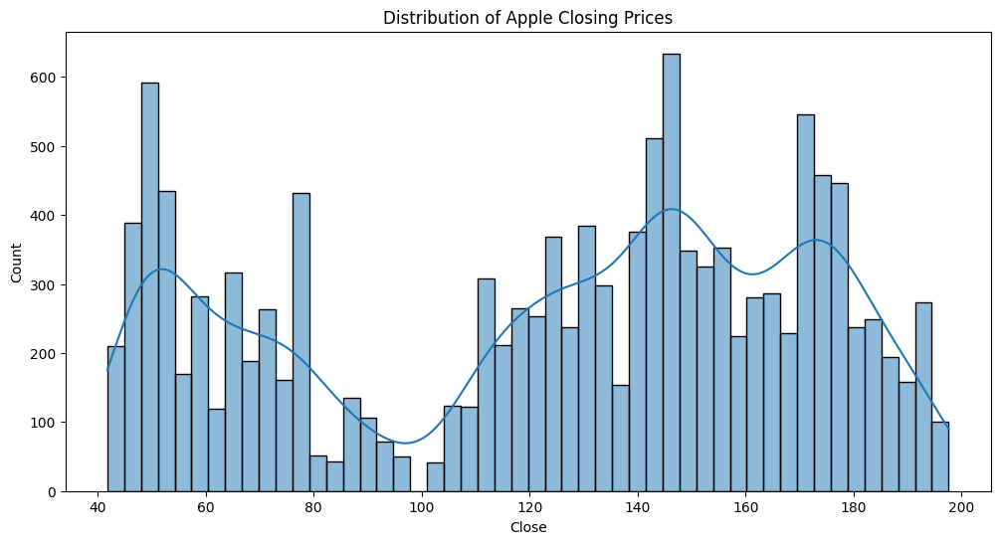

In [11]:
# Distribution of key features
plt.figure(figsize=(12, 6))
sns.histplot(df[df['Ticker'] == "AAPL"]['Close'], bins=50, kde=True)
plt.title('Distribution of Apple Closing Prices')
plt.show()



In [12]:
df.columns

Index(['Publishing Time', 'Market Time', 'Date', 'Ticker', 'Sector',
       'sentiment_neg', 'sentiment_neu', 'sentiment_pos', 'sentiment_tot',
       'finvader', 'Headline', 'Text', 'URL', 'Open', 'High', 'Low', 'Close',
       'Volume', 'Dividends', 'Stock Splits'],
      dtype='object')

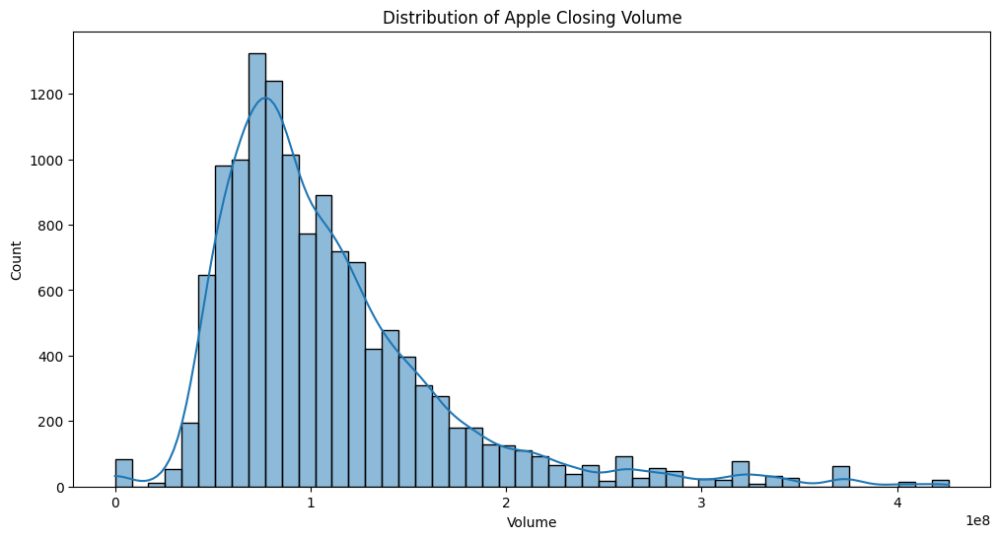

In [13]:
plt.figure(figsize=(12, 6))
sns.histplot(df[df['Ticker'] == "AAPL"]['Volume'], bins=50, kde=True)
plt.title('Distribution of Apple Closing Volume')
plt.show()



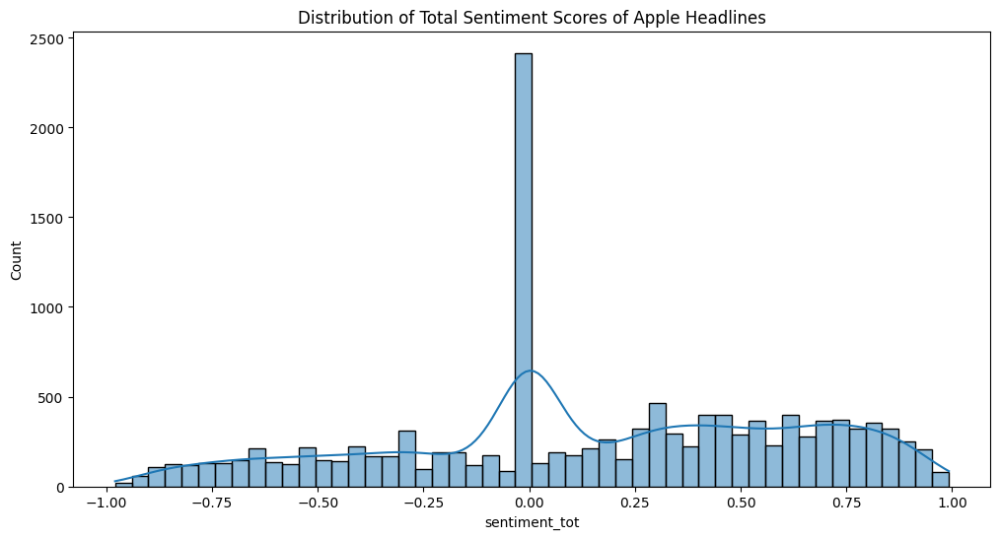

In [14]:
plt.figure(figsize=(12, 6))
sns.histplot(df[df['Ticker'] == "AAPL"]['sentiment_tot'], bins=50, kde=True)
plt.title('Distribution of Total Sentiment Scores of Apple Headlines')
plt.show()


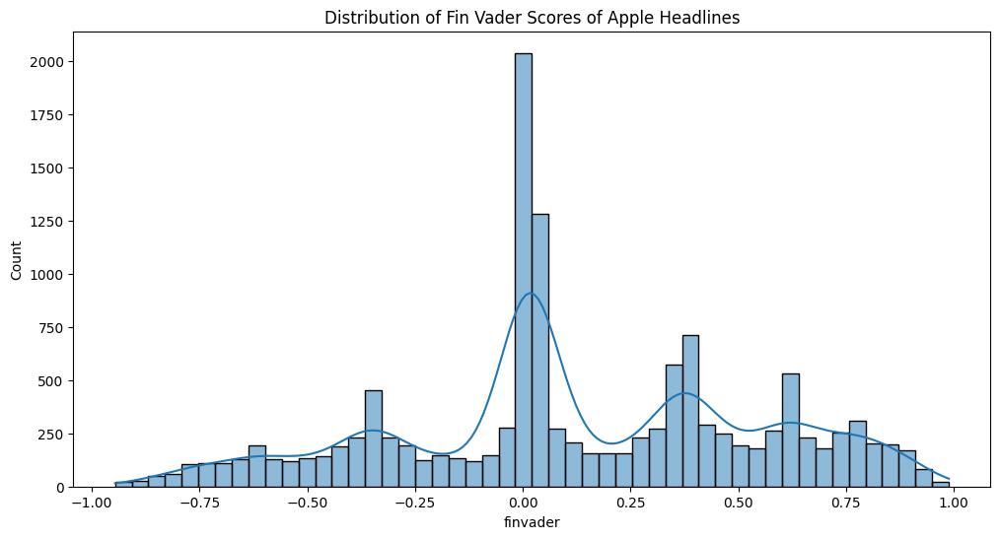

In [15]:
plt.figure(figsize=(12, 6))
sns.histplot(df[df['Ticker'] == "AAPL"]['finvader'], bins=50, kde=True)
plt.title('Distribution of Fin Vader Scores of Apple Headlines')
plt.show()

### Time Series Analysis

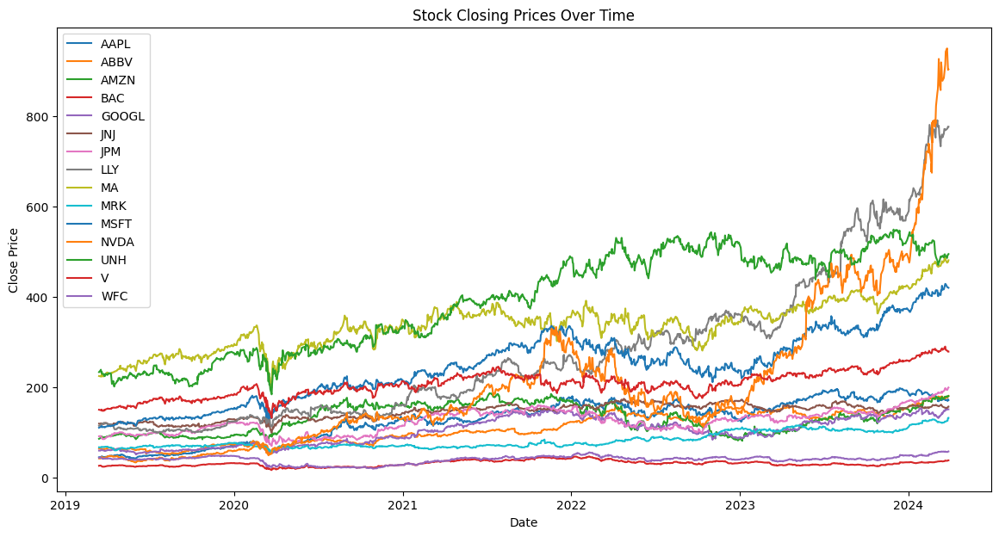

In [16]:
# Plot time series of stock prices and sentiment scores
plt.figure(figsize=(14, 7))
for ticker in df['Ticker'].unique()[:15]:  
    subset = df[df['Ticker'] == ticker]
    plt.plot(subset['Date'], subset['Close'], label=ticker)
plt.title('Stock Closing Prices Over Time')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()

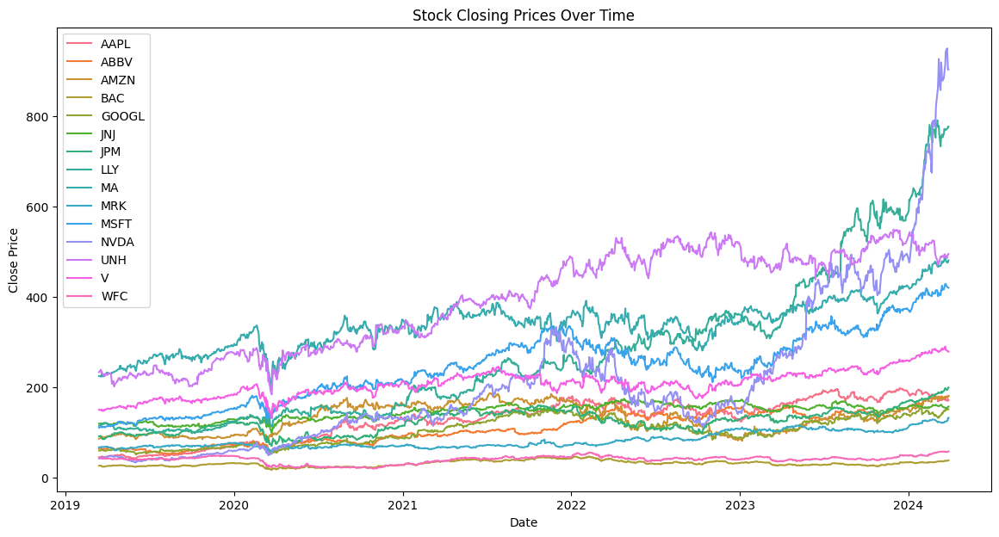

In [17]:
# Define a color palette with enough unique colors
palette = sns.color_palette("husl", len(df['Ticker'].unique()))

# Create a dictionary to map each ticker to a specific color
color_map = {ticker: palette[i] for i, ticker in enumerate(df['Ticker'].unique())}

# Plot the stock closing prices over time
plt.figure(figsize=(14, 7))
for ticker in df['Ticker'].unique()[:15]:  # plot for the first 15 tickers
    subset = df[df['Ticker'] == ticker]
    plt.plot(subset['Date'], subset['Close'], label=ticker, color=color_map[ticker])

plt.title('Stock Closing Prices Over Time')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()

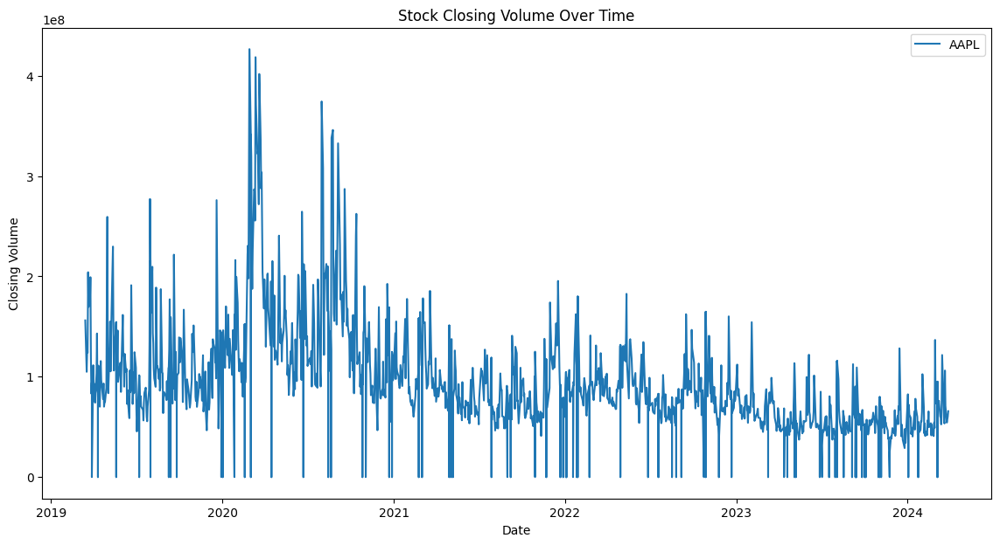

In [18]:
# Plot time series of stock volume
plt.figure(figsize=(14, 7))
for ticker in df['Ticker'].unique()[:1]:  
    subset = df[df['Ticker'] == ticker]
    plt.plot(subset['Date'], subset['Volume'], label=ticker)
plt.title('Stock Closing Volume Over Time')
plt.xlabel('Date')
plt.ylabel('Closing Volume')
plt.legend()
plt.show()

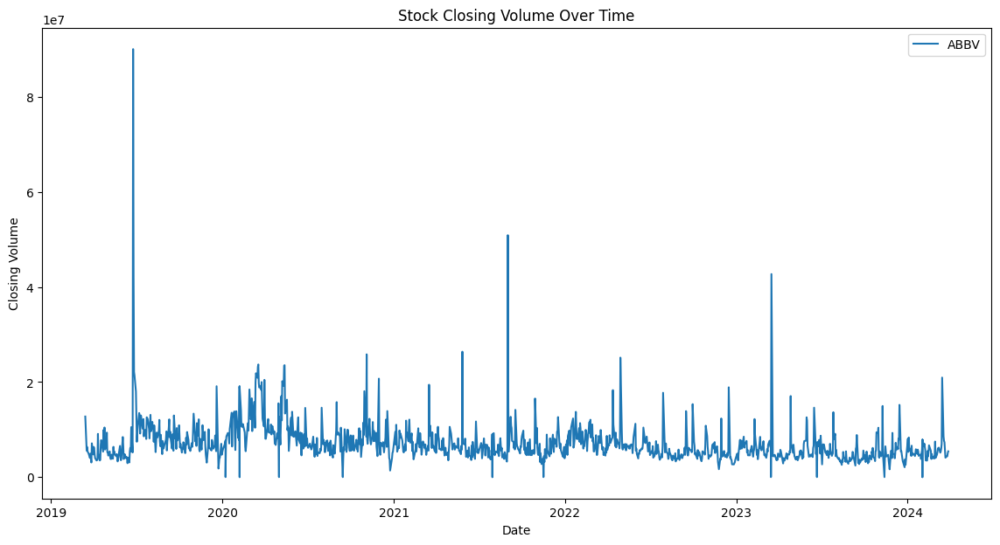

In [19]:
# Plot time series of stock volume
plt.figure(figsize=(14, 7))
for ticker in df['Ticker'].unique()[1:2]:  
    subset = df[df['Ticker'] == ticker]
    plt.plot(subset['Date'], subset['Volume'], label=ticker)
plt.title('Stock Closing Volume Over Time')
plt.xlabel('Date')
plt.ylabel('Closing Volume')
plt.legend()
plt.show()

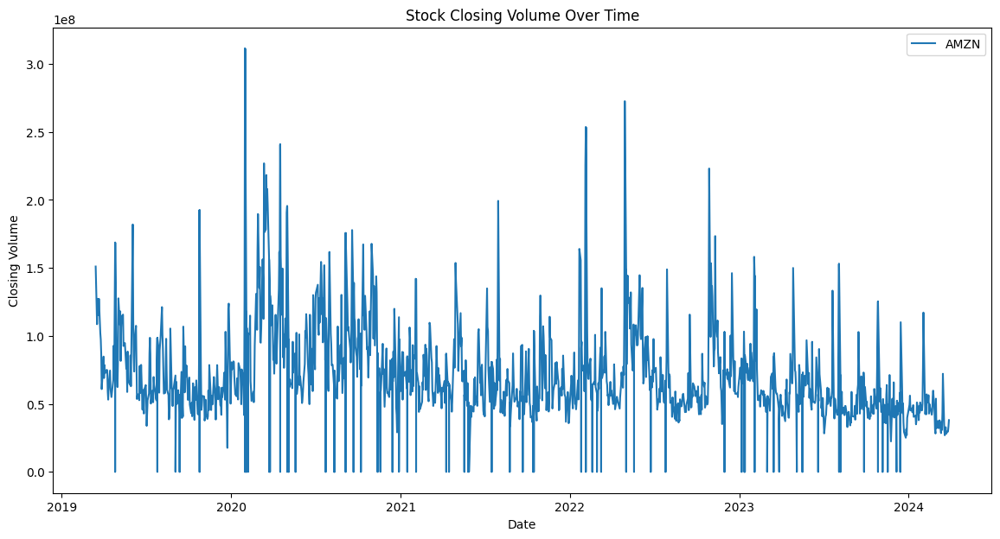

In [20]:
# Plot time series of stock volume
plt.figure(figsize=(14, 7))
for ticker in df['Ticker'].unique()[2:3]:  
    subset = df[df['Ticker'] == ticker]
    plt.plot(subset['Date'], subset['Volume'], label=ticker)
plt.title('Stock Closing Volume Over Time')
plt.xlabel('Date')
plt.ylabel('Closing Volume')
plt.legend()
plt.show()

In [21]:
df['Ticker'].unique()

array(['AAPL', 'ABBV', 'AMZN', 'BAC', 'GOOGL', 'JNJ', 'JPM', 'LLY', 'MA',
       'MRK', 'MSFT', 'NVDA', 'UNH', 'V', 'WFC'], dtype=object)

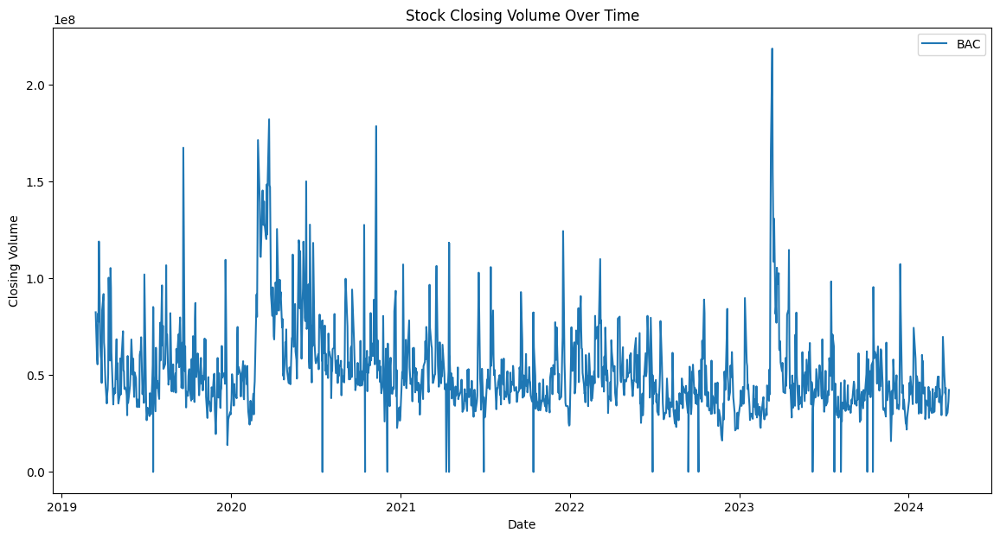

In [22]:
# Plot time series of stock volume
plt.figure(figsize=(14, 7))
for ticker in df['Ticker'].unique()[3:4]:  
    subset = df[df['Ticker'] == ticker]
    plt.plot(subset['Date'], subset['Volume'], label=ticker)
plt.title('Stock Closing Volume Over Time')
plt.xlabel('Date')
plt.ylabel('Closing Volume')
plt.legend()
plt.show()

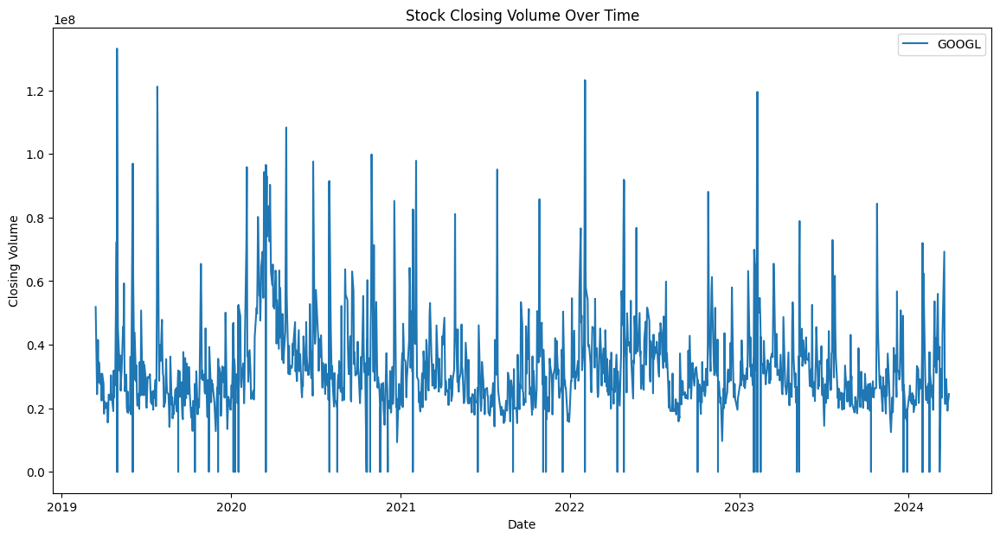

In [23]:
# Plot time series of stock volume
plt.figure(figsize=(14, 7))
for ticker in df['Ticker'].unique()[4:5]:  
    subset = df[df['Ticker'] == ticker]
    plt.plot(subset['Date'], subset['Volume'], label=ticker)
plt.title('Stock Closing Volume Over Time')
plt.xlabel('Date')
plt.ylabel('Closing Volume')
plt.legend()
plt.show()

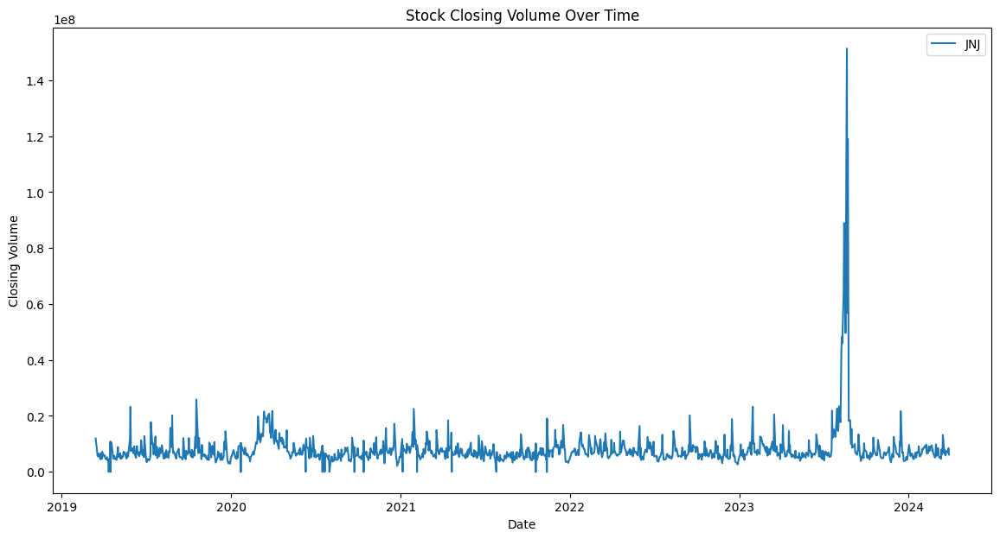

In [24]:
# Plot time series of stock volume
plt.figure(figsize=(14, 7))
for ticker in df['Ticker'].unique()[5:6]:  
    subset = df[df['Ticker'] == ticker]
    plt.plot(subset['Date'], subset['Volume'], label=ticker)
plt.title('Stock Closing Volume Over Time')
plt.xlabel('Date')
plt.ylabel('Closing Volume')
plt.legend()
plt.show()

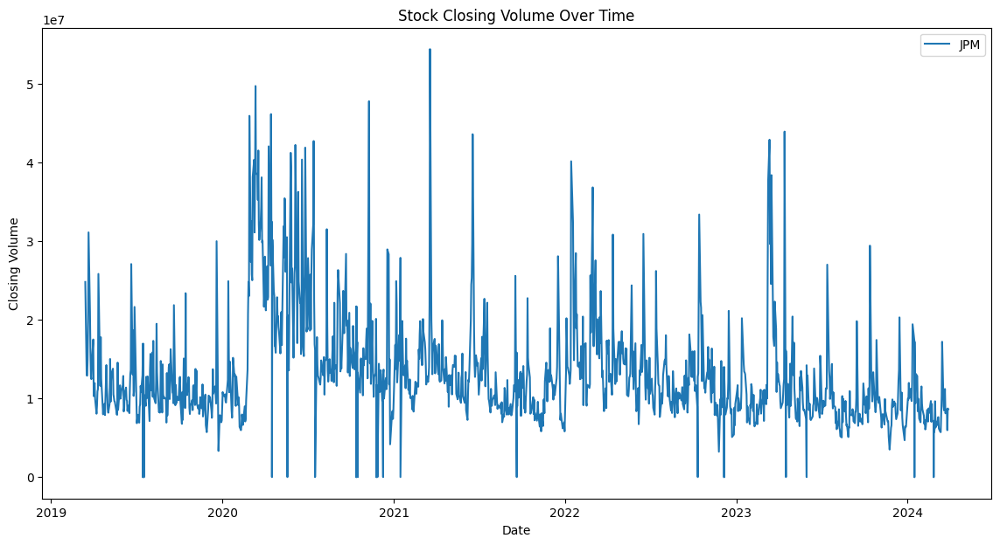

In [25]:
# Plot time series of stock volume
plt.figure(figsize=(14, 7))
for ticker in df['Ticker'].unique()[6:7]:  
    subset = df[df['Ticker'] == ticker]
    plt.plot(subset['Date'], subset['Volume'], label=ticker)
plt.title('Stock Closing Volume Over Time')
plt.xlabel('Date')
plt.ylabel('Closing Volume')
plt.legend()
plt.show()

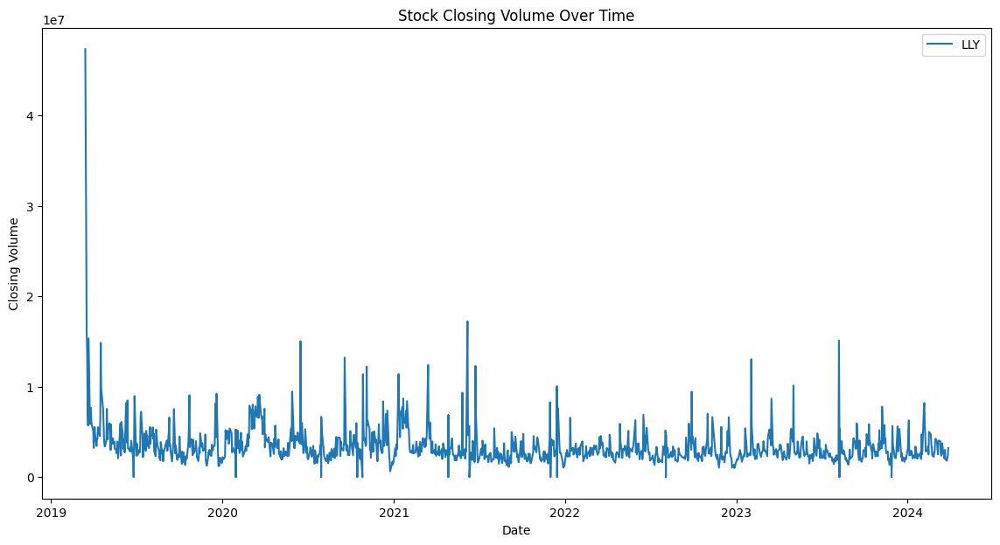

In [26]:
# Plot time series of stock volume
plt.figure(figsize=(14, 7))
for ticker in df['Ticker'].unique()[7:8]:  
    subset = df[df['Ticker'] == ticker]
    plt.plot(subset['Date'], subset['Volume'], label=ticker)
plt.title('Stock Closing Volume Over Time')
plt.xlabel('Date')
plt.ylabel('Closing Volume')
plt.legend()
plt.show()

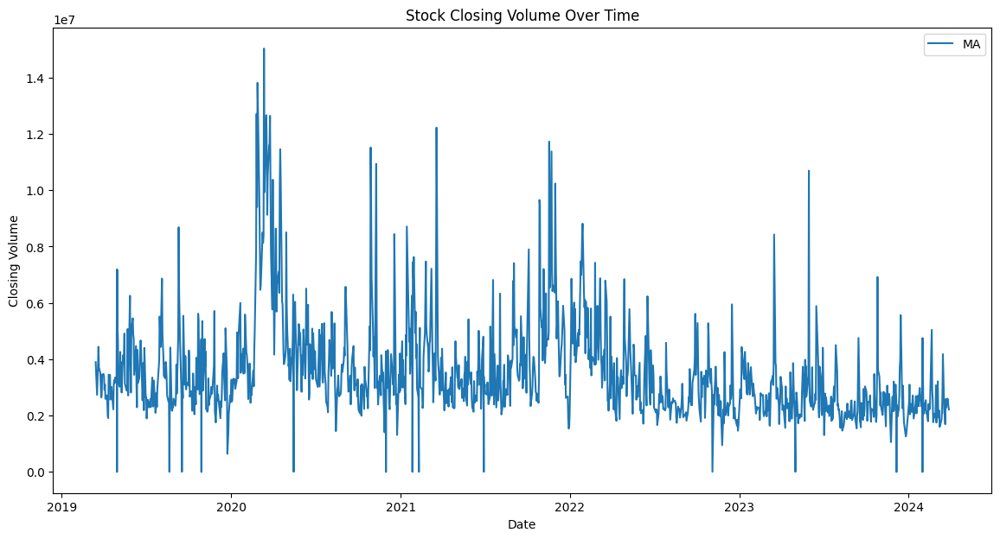

In [27]:
# Plot time series of stock volume
plt.figure(figsize=(14, 7))
for ticker in df['Ticker'].unique()[8:9]:  
    subset = df[df['Ticker'] == ticker]
    plt.plot(subset['Date'], subset['Volume'], label=ticker)
plt.title('Stock Closing Volume Over Time')
plt.xlabel('Date')
plt.ylabel('Closing Volume')
plt.legend()
plt.show()

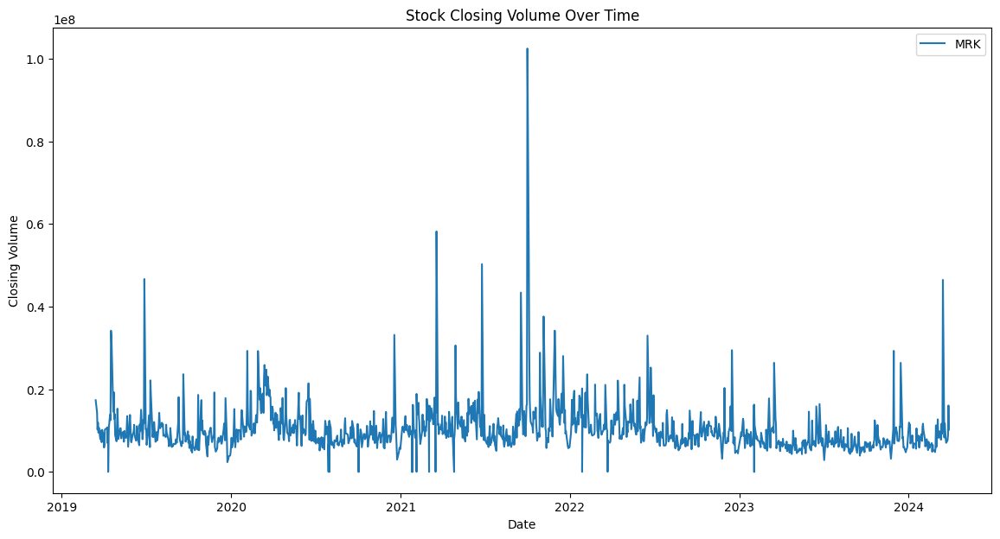

In [28]:
# Plot time series of stock volume
plt.figure(figsize=(14, 7))
for ticker in df['Ticker'].unique()[9:10]:  
    subset = df[df['Ticker'] == ticker]
    plt.plot(subset['Date'], subset['Volume'], label=ticker)
plt.title('Stock Closing Volume Over Time')
plt.xlabel('Date')
plt.ylabel('Closing Volume')
plt.legend()
plt.show()

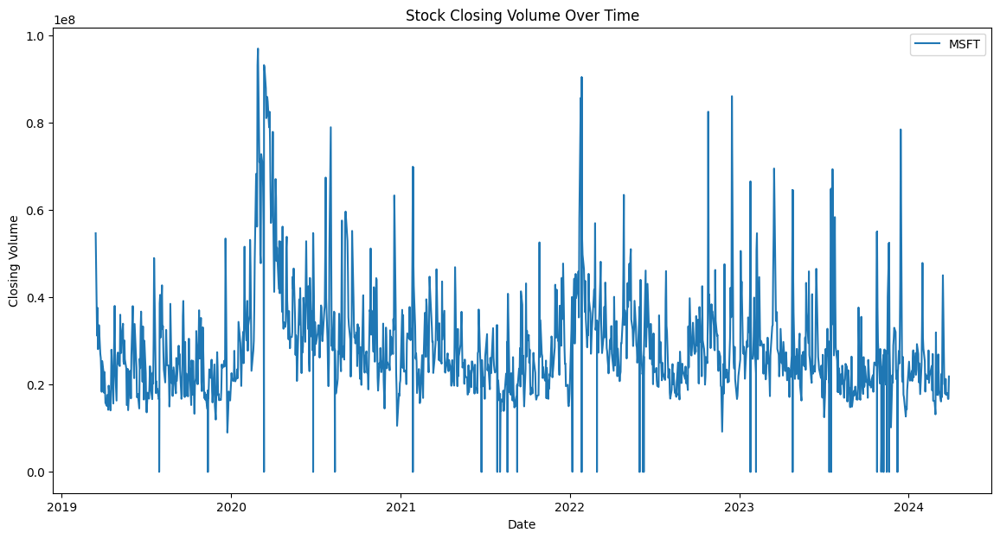

In [29]:
# Plot time series of stock volume
plt.figure(figsize=(14, 7))
for ticker in df['Ticker'].unique()[10:11]:  
    subset = df[df['Ticker'] == ticker]
    plt.plot(subset['Date'], subset['Volume'], label=ticker)
plt.title('Stock Closing Volume Over Time')
plt.xlabel('Date')
plt.ylabel('Closing Volume')
plt.legend()
plt.show()

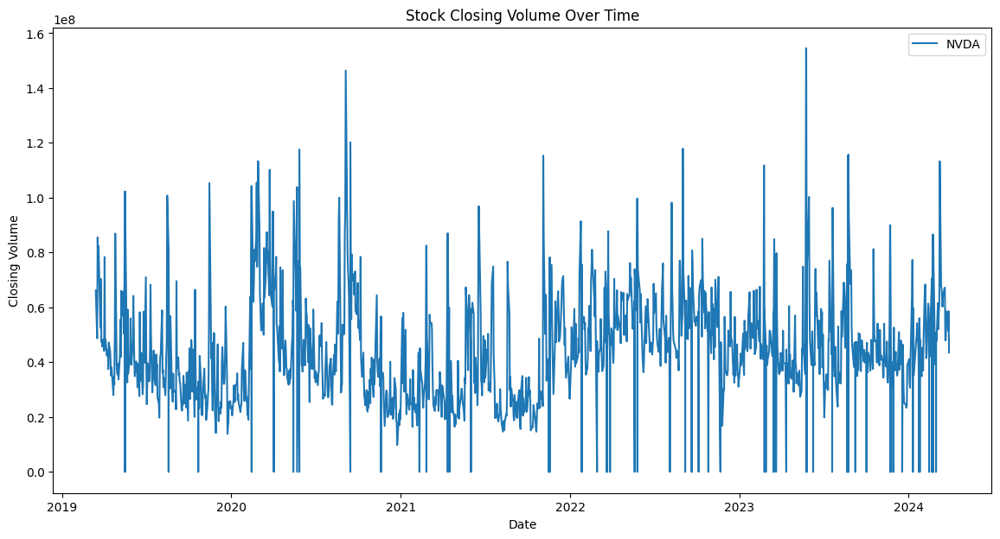

In [30]:
# Plot time series of stock volume
plt.figure(figsize=(14, 7))
for ticker in df['Ticker'].unique()[11:12]:  
    subset = df[df['Ticker'] == ticker]
    plt.plot(subset['Date'], subset['Volume'], label=ticker)
plt.title('Stock Closing Volume Over Time')
plt.xlabel('Date')
plt.ylabel('Closing Volume')
plt.legend()
plt.show()

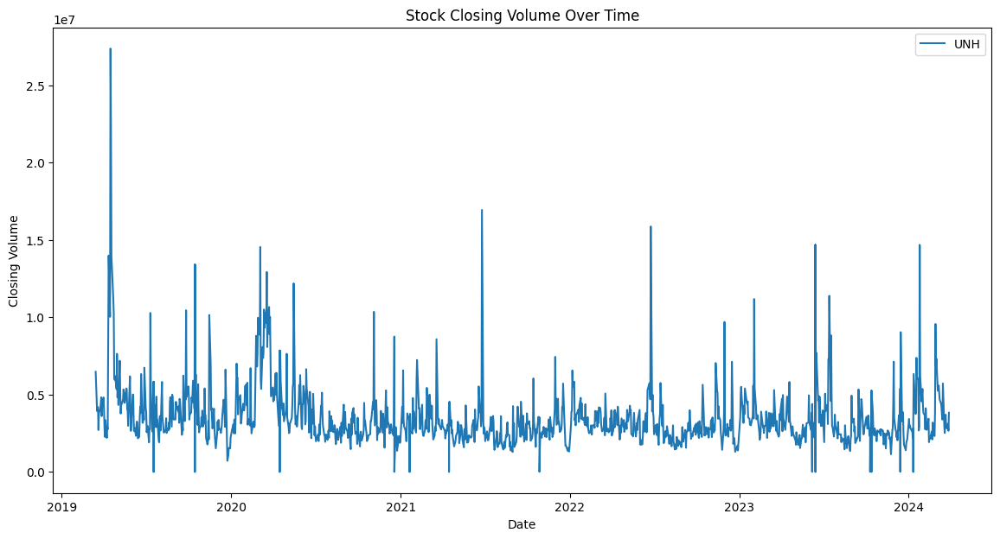

In [31]:
# Plot time series of stock volume
plt.figure(figsize=(14, 7))
for ticker in df['Ticker'].unique()[12:13]:  
    subset = df[df['Ticker'] == ticker]
    plt.plot(subset['Date'], subset['Volume'], label=ticker)
plt.title('Stock Closing Volume Over Time')
plt.xlabel('Date')
plt.ylabel('Closing Volume')
plt.legend()
plt.show()

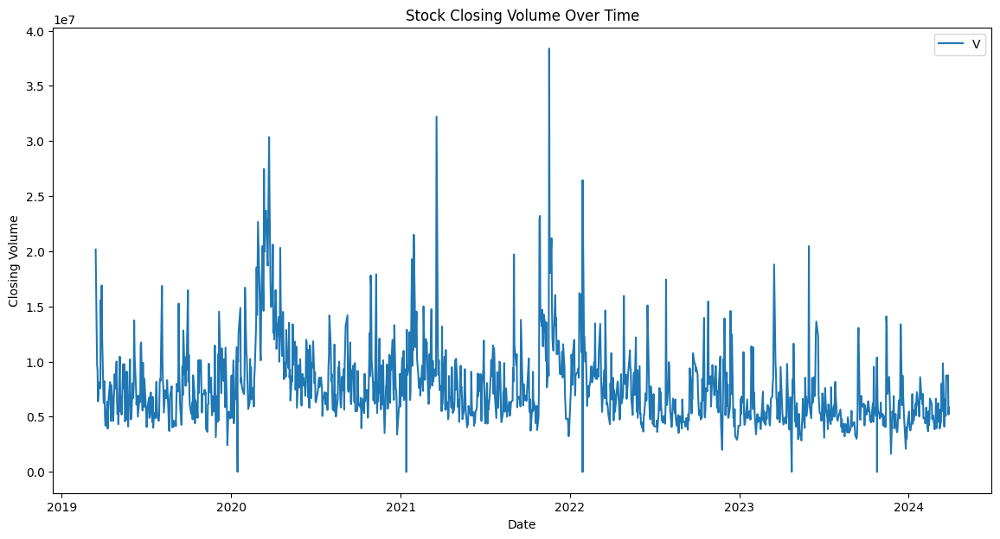

In [32]:
# Plot time series of stock volume
plt.figure(figsize=(14, 7))
for ticker in df['Ticker'].unique()[13:14]:  
    subset = df[df['Ticker'] == ticker]
    plt.plot(subset['Date'], subset['Volume'], label=ticker)
plt.title('Stock Closing Volume Over Time')
plt.xlabel('Date')
plt.ylabel('Closing Volume')
plt.legend()
plt.show()

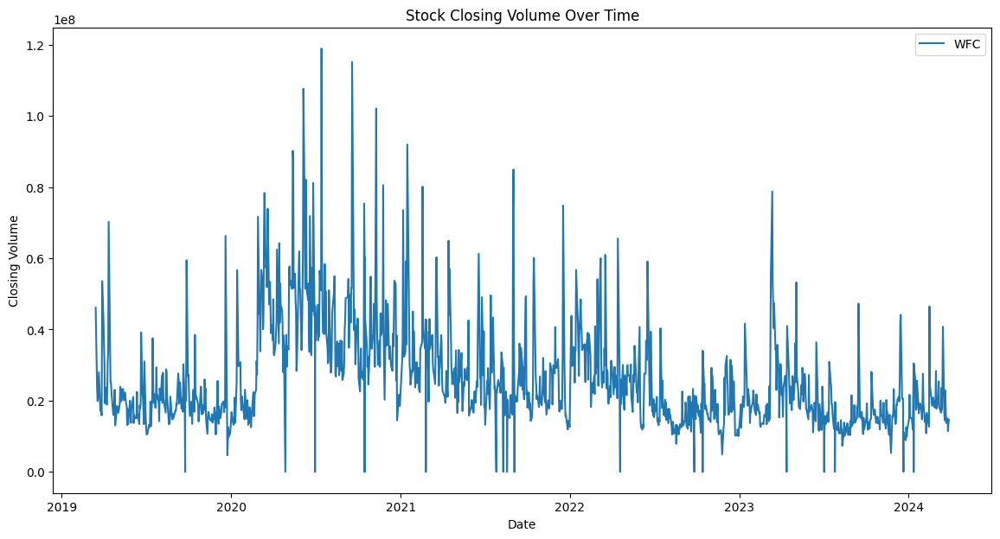

In [33]:
# Plot time series of stock volume
plt.figure(figsize=(14, 7))
for ticker in df['Ticker'].unique()[14:15]:  
    subset = df[df['Ticker'] == ticker]
    plt.plot(subset['Date'], subset['Volume'], label=ticker)
plt.title('Stock Closing Volume Over Time')
plt.xlabel('Date')
plt.ylabel('Closing Volume')
plt.legend()
plt.show()

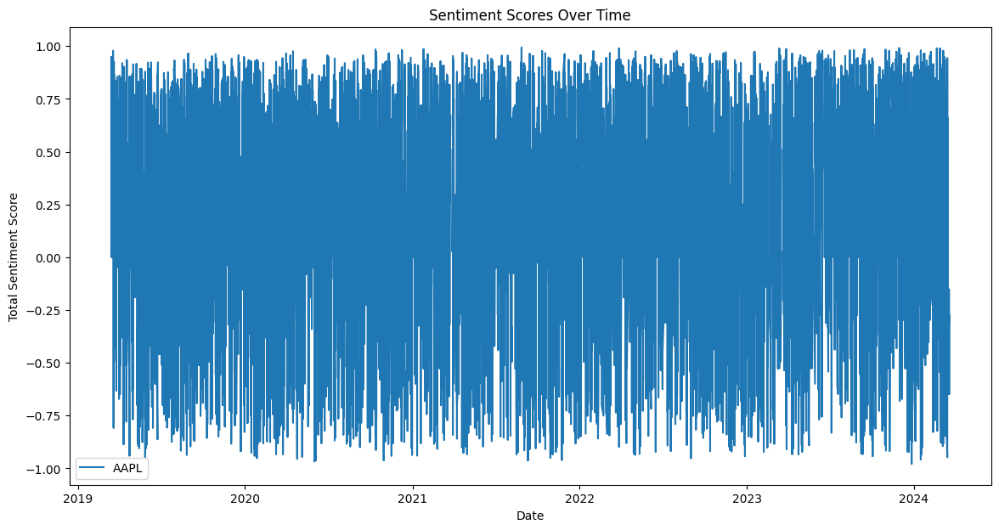

In [34]:
# Plot time series of sentiment scores

plt.figure(figsize=(14, 7))
for ticker in df['Ticker'].unique()[:1]:
    subset = df[df['Ticker'] == ticker]
    plt.plot(subset['Date'], subset['sentiment_tot'], label=ticker)
plt.title('Sentiment Scores Over Time')
plt.xlabel('Date')
plt.ylabel('Total Sentiment Score')
plt.legend()
plt.show()

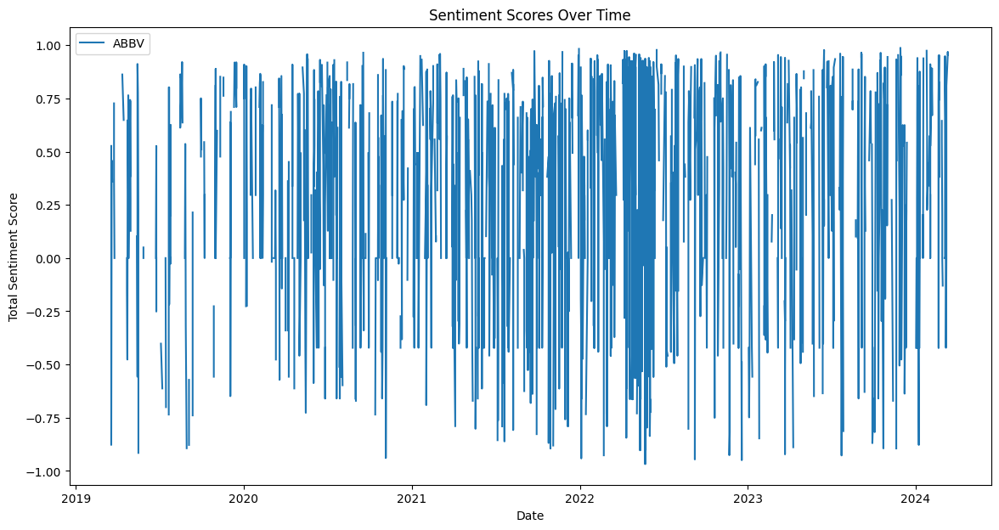

In [35]:
# Plot time series of sentiment scores

plt.figure(figsize=(14, 7))
for ticker in df['Ticker'].unique()[1:2]:
    subset = df[df['Ticker'] == ticker]
    plt.plot(subset['Date'], subset['sentiment_tot'], label=ticker)
plt.title('Sentiment Scores Over Time')
plt.xlabel('Date')
plt.ylabel('Total Sentiment Score')
plt.legend()
plt.show()

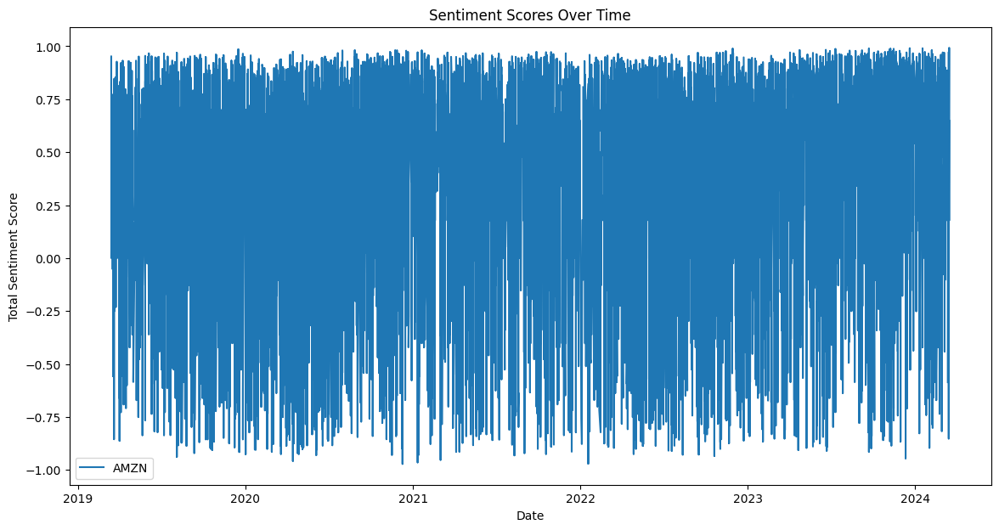

In [36]:
# Plot time series of sentiment scores

plt.figure(figsize=(14, 7))
for ticker in df['Ticker'].unique()[2:3]:
    subset = df[df['Ticker'] == ticker]
    plt.plot(subset['Date'], subset['sentiment_tot'], label=ticker)
plt.title('Sentiment Scores Over Time')
plt.xlabel('Date')
plt.ylabel('Total Sentiment Score')
plt.legend()
plt.show()

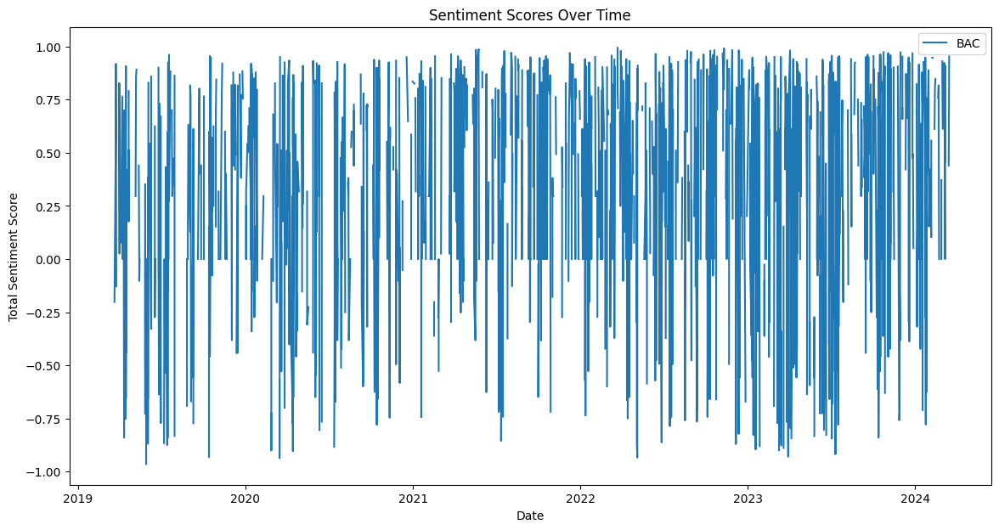

In [37]:
# Plot time series of sentiment scores

plt.figure(figsize=(14, 7))
for ticker in df['Ticker'].unique()[3:4]:
    subset = df[df['Ticker'] == ticker]
    plt.plot(subset['Date'], subset['sentiment_tot'], label=ticker)
plt.title('Sentiment Scores Over Time')
plt.xlabel('Date')
plt.ylabel('Total Sentiment Score')
plt.legend()
plt.show()

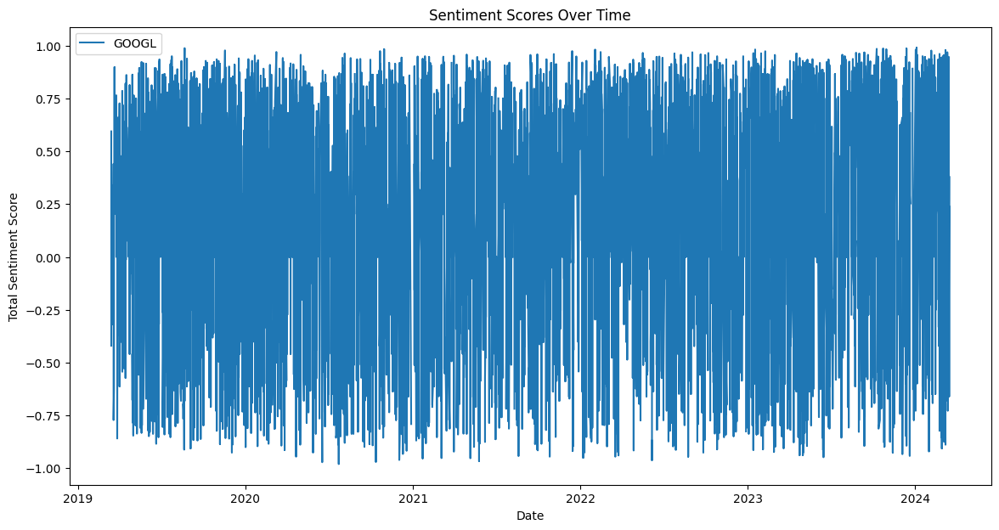

In [38]:
# Plot time series of sentiment scores

plt.figure(figsize=(14, 7))
for ticker in df['Ticker'].unique()[4:5]:
    subset = df[df['Ticker'] == ticker]
    plt.plot(subset['Date'], subset['sentiment_tot'], label=ticker)
plt.title('Sentiment Scores Over Time')
plt.xlabel('Date')
plt.ylabel('Total Sentiment Score')
plt.legend()
plt.show()

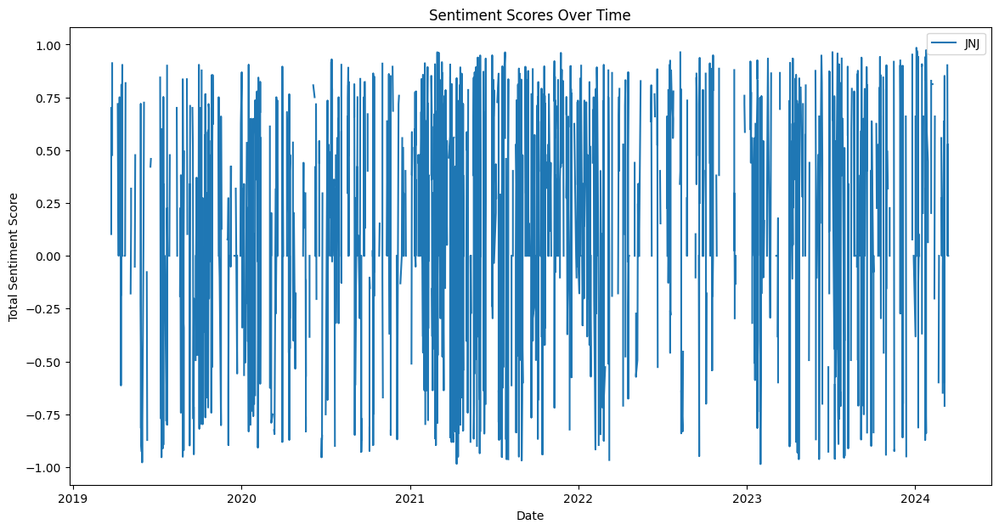

In [39]:
# Plot time series of sentiment scores

plt.figure(figsize=(14, 7))
for ticker in df['Ticker'].unique()[5:6]:
    subset = df[df['Ticker'] == ticker]
    plt.plot(subset['Date'], subset['sentiment_tot'], label=ticker)
plt.title('Sentiment Scores Over Time')
plt.xlabel('Date')
plt.ylabel('Total Sentiment Score')
plt.legend()
plt.show()

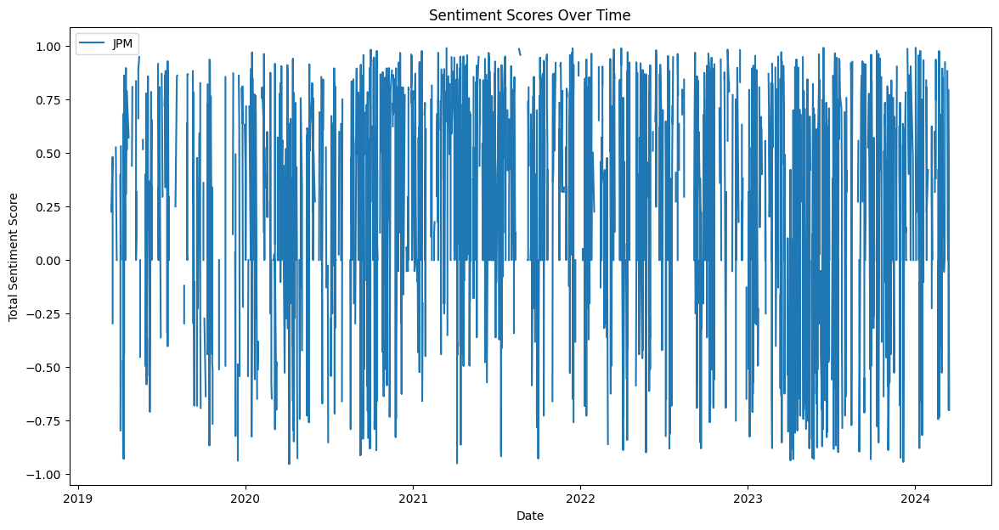

In [40]:
# Plot time series of sentiment scores

plt.figure(figsize=(14, 7))
for ticker in df['Ticker'].unique()[6:7]:
    subset = df[df['Ticker'] == ticker]
    plt.plot(subset['Date'], subset['sentiment_tot'], label=ticker)
plt.title('Sentiment Scores Over Time')
plt.xlabel('Date')
plt.ylabel('Total Sentiment Score')
plt.legend()
plt.show()

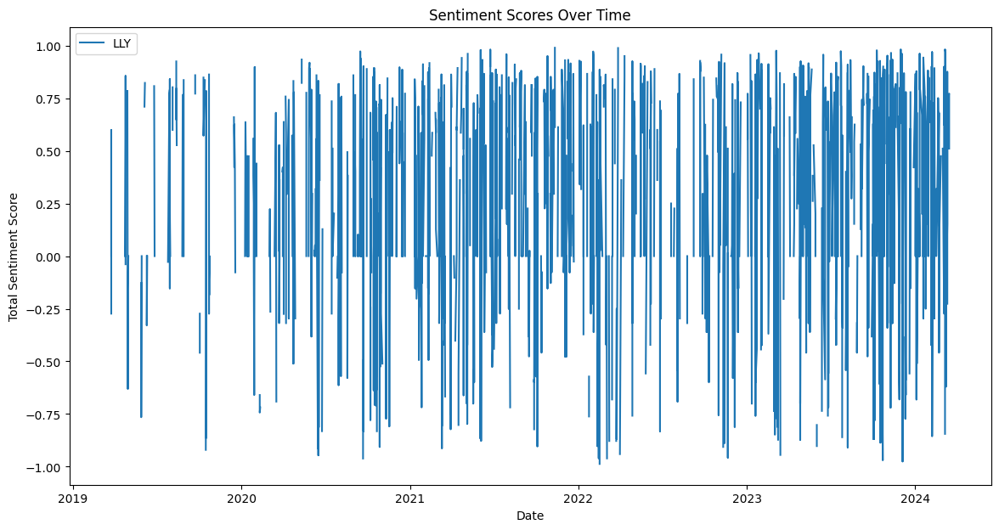

In [41]:
# Plot time series of sentiment scores

plt.figure(figsize=(14, 7))
for ticker in df['Ticker'].unique()[7:8]:
    subset = df[df['Ticker'] == ticker]
    plt.plot(subset['Date'], subset['sentiment_tot'], label=ticker)
plt.title('Sentiment Scores Over Time')
plt.xlabel('Date')
plt.ylabel('Total Sentiment Score')
plt.legend()
plt.show()

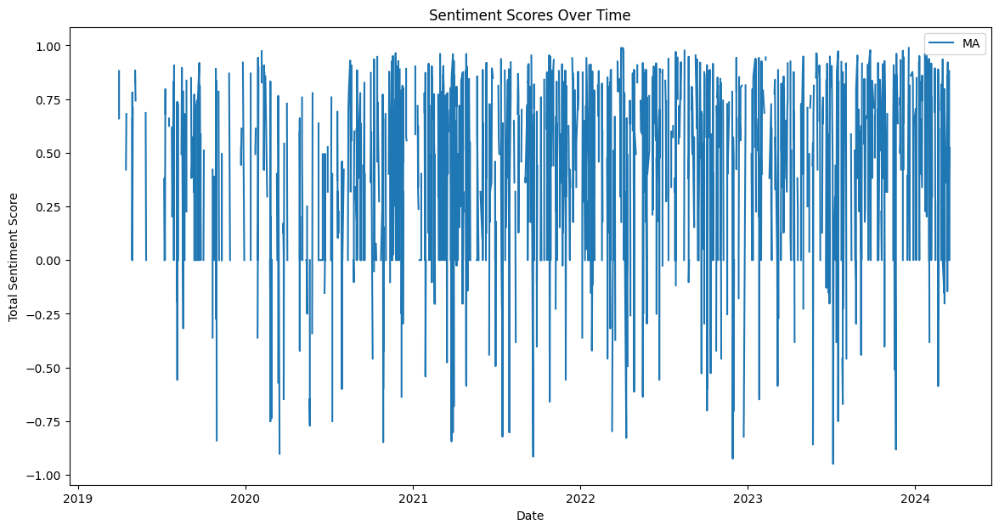

In [42]:
# Plot time series of sentiment scores

plt.figure(figsize=(14, 7))
for ticker in df['Ticker'].unique()[8:9]:
    subset = df[df['Ticker'] == ticker]
    plt.plot(subset['Date'], subset['sentiment_tot'], label=ticker)
plt.title('Sentiment Scores Over Time')
plt.xlabel('Date')
plt.ylabel('Total Sentiment Score')
plt.legend()
plt.show()

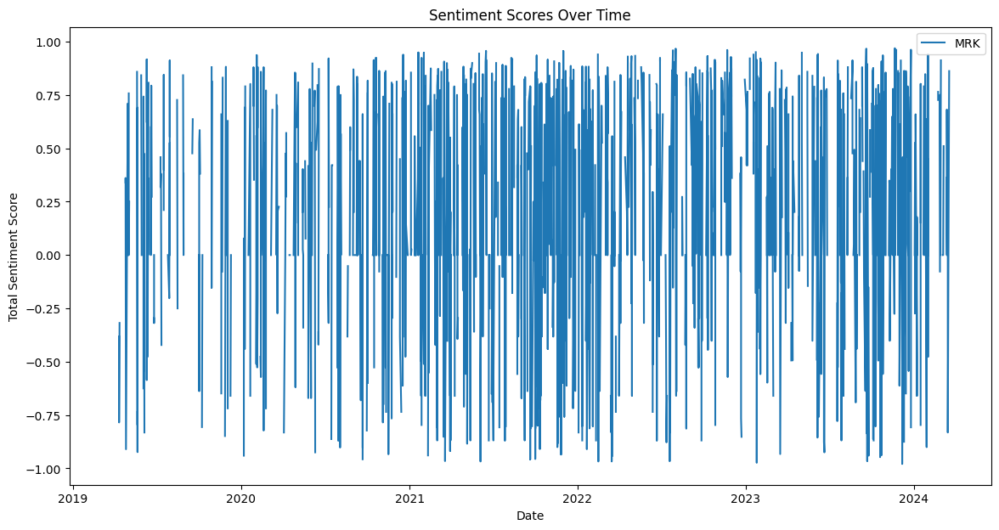

In [43]:
# Plot time series of sentiment scores

plt.figure(figsize=(14, 7))
for ticker in df['Ticker'].unique()[9:10]:
    subset = df[df['Ticker'] == ticker]
    plt.plot(subset['Date'], subset['sentiment_tot'], label=ticker)
plt.title('Sentiment Scores Over Time')
plt.xlabel('Date')
plt.ylabel('Total Sentiment Score')
plt.legend()
plt.show()

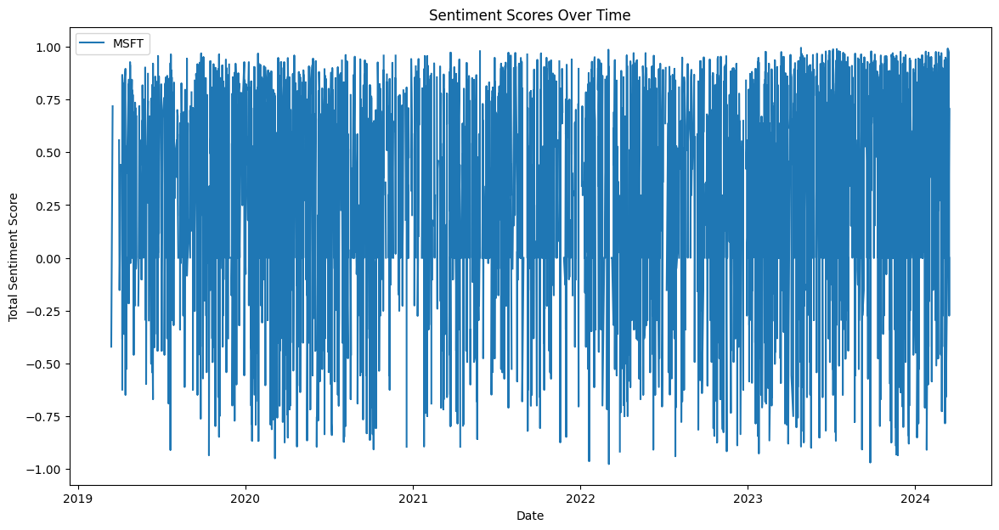

In [44]:
# Plot time series of sentiment scores

plt.figure(figsize=(14, 7))
for ticker in df['Ticker'].unique()[10:11]:
    subset = df[df['Ticker'] == ticker]
    plt.plot(subset['Date'], subset['sentiment_tot'], label=ticker)
plt.title('Sentiment Scores Over Time')
plt.xlabel('Date')
plt.ylabel('Total Sentiment Score')
plt.legend()
plt.show()

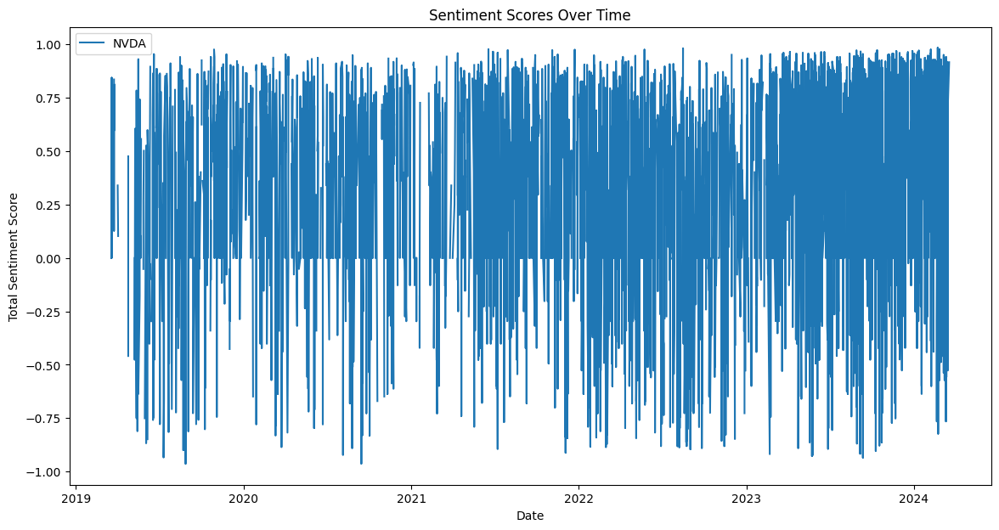

In [45]:
# Plot time series of sentiment scores

plt.figure(figsize=(14, 7))
for ticker in df['Ticker'].unique()[11:12]:
    subset = df[df['Ticker'] == ticker]
    plt.plot(subset['Date'], subset['sentiment_tot'], label=ticker)
plt.title('Sentiment Scores Over Time')
plt.xlabel('Date')
plt.ylabel('Total Sentiment Score')
plt.legend()
plt.show()

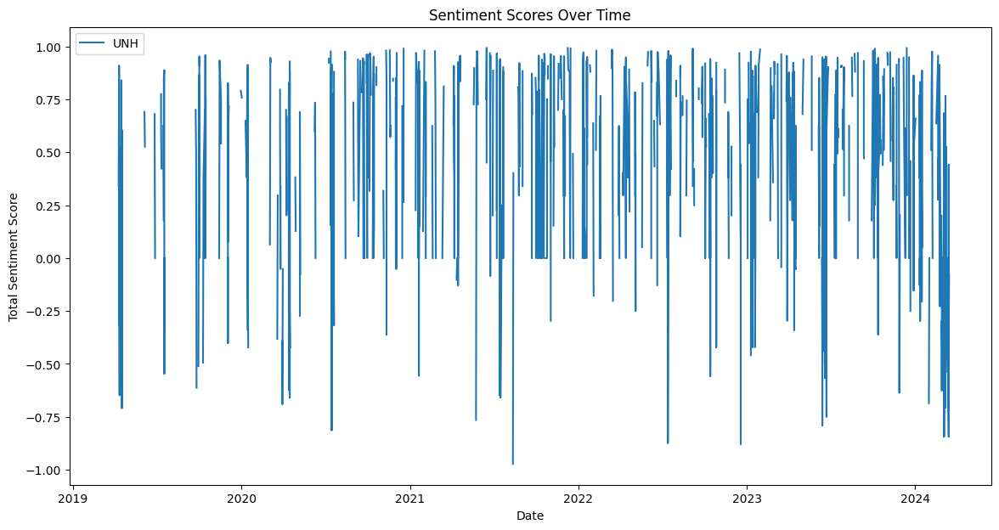

In [46]:
# Plot time series of sentiment scores

plt.figure(figsize=(14, 7))
for ticker in df['Ticker'].unique()[12:13]:
    subset = df[df['Ticker'] == ticker]
    plt.plot(subset['Date'], subset['sentiment_tot'], label=ticker)
plt.title('Sentiment Scores Over Time')
plt.xlabel('Date')
plt.ylabel('Total Sentiment Score')
plt.legend()
plt.show()

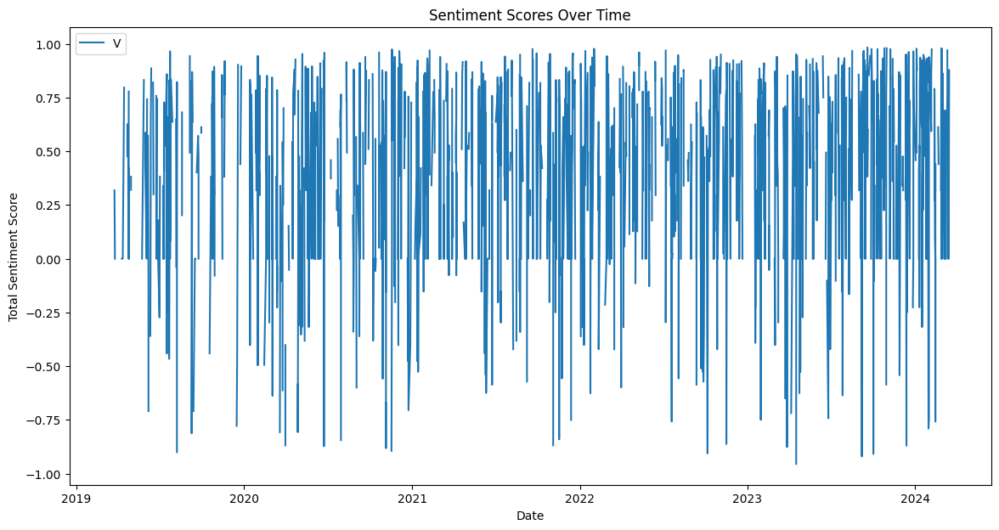

In [47]:
# Plot time series of sentiment scores

plt.figure(figsize=(14, 7))
for ticker in df['Ticker'].unique()[13:14]:
    subset = df[df['Ticker'] == ticker]
    plt.plot(subset['Date'], subset['sentiment_tot'], label=ticker)
plt.title('Sentiment Scores Over Time')
plt.xlabel('Date')
plt.ylabel('Total Sentiment Score')
plt.legend()
plt.show()

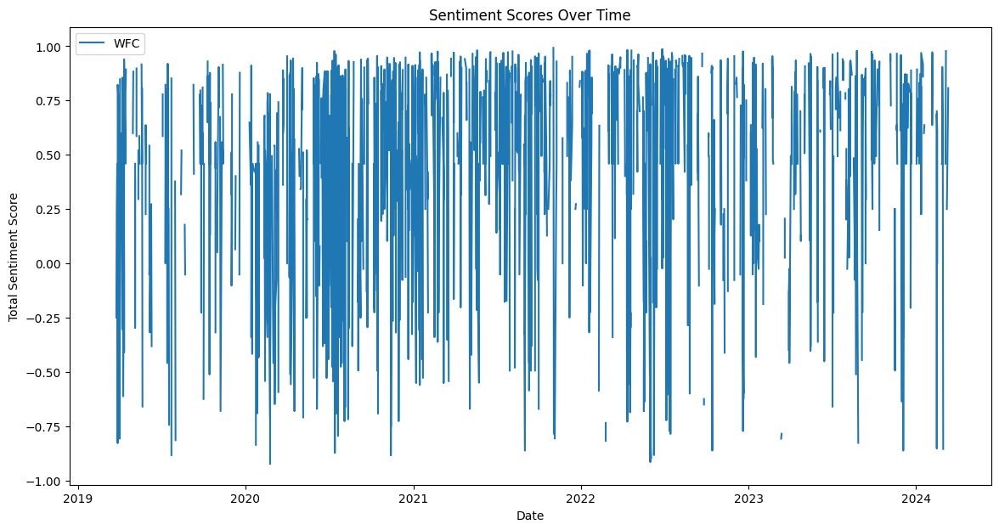

In [48]:
# Plot time series of sentiment scores

plt.figure(figsize=(14, 7))
for ticker in df['Ticker'].unique()[14:15]:
    subset = df[df['Ticker'] == ticker]
    plt.plot(subset['Date'], subset['sentiment_tot'], label=ticker)
plt.title('Sentiment Scores Over Time')
plt.xlabel('Date')
plt.ylabel('Total Sentiment Score')
plt.legend()
plt.show()

### Correlation Analysis

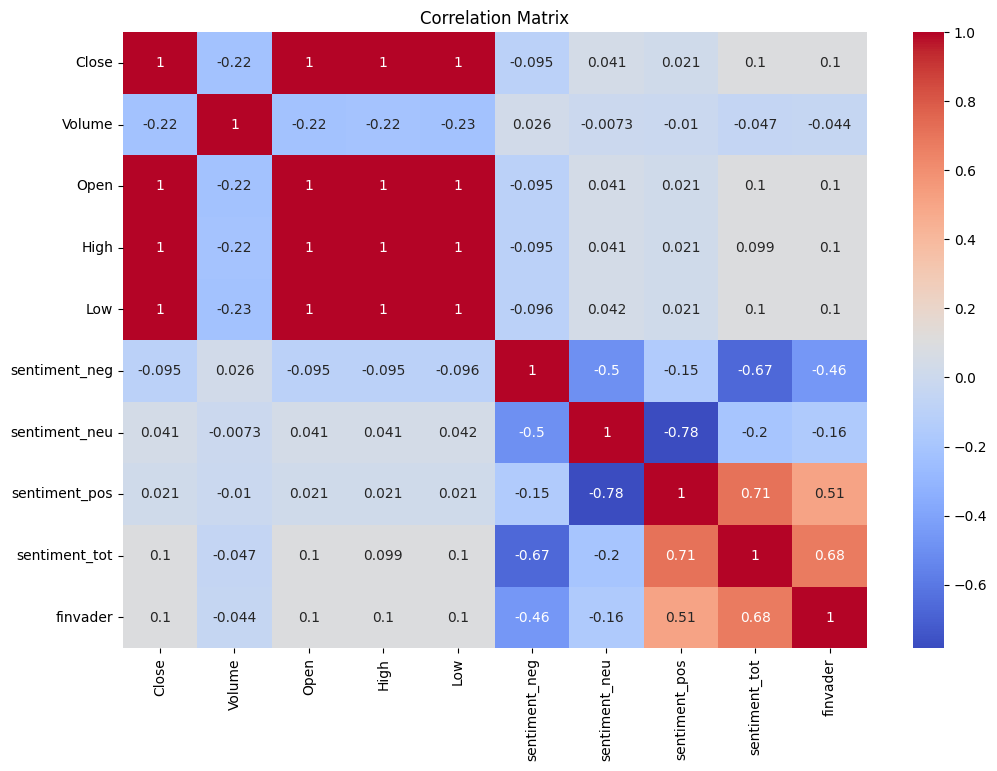

In [49]:
# Calculate correlation matrix
correlation_matrix = df[['Close', 'Volume', 'Open', 'High', 'Low', 'sentiment_neg', 'sentiment_neu', 'sentiment_pos', 'sentiment_tot', 'finvader']].corr()

# Visualize the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()


### Time series plot of Closing Price and Vader Sentiment Score

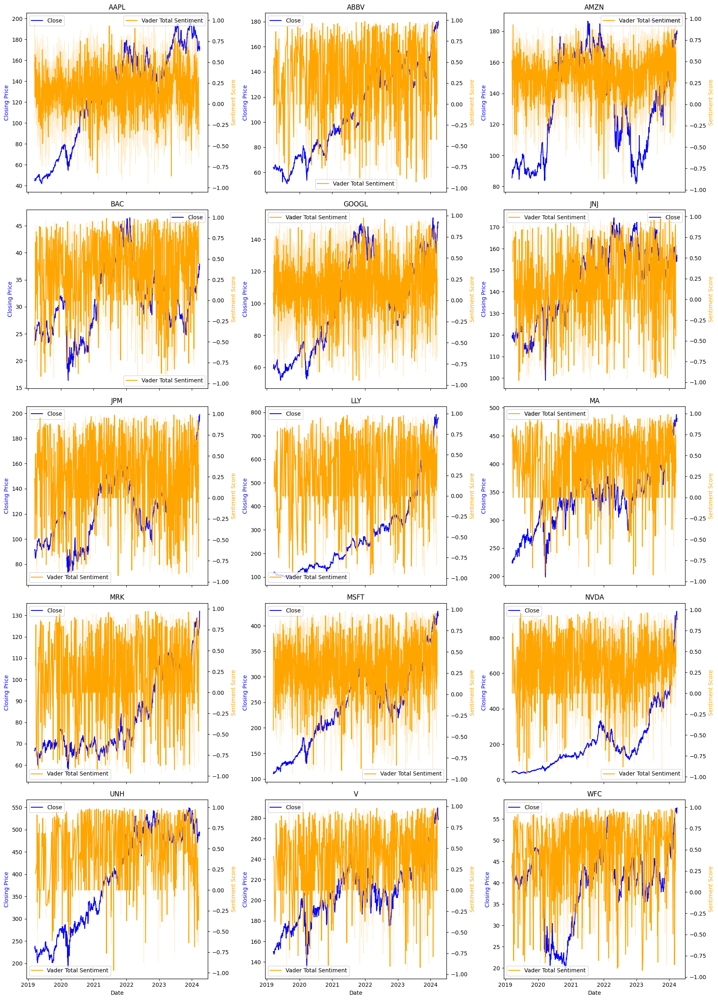

In [50]:

# Assuming your DataFrame is named `df`
tickers = df['Ticker'].unique()

# Define the number of rows and columns for subplots
num_tickers = len(tickers)
num_cols = 3
num_rows = (num_tickers // num_cols) + (num_tickers % num_cols > 0)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, num_rows * 5), sharex=True)
axes = axes.flatten()

for i, ticker in enumerate(tickers):
    ax = axes[i]
    subset = df[df['Ticker'] == ticker]
    
    # Plot closing price
    sns.lineplot(data=subset, x='Date', y='Close', ax=ax, label='Close', color='blue')
    # Plot sentiment score on secondary y-axis
    ax2 = ax.twinx()
    sns.lineplot(data=subset, x='Date', y='sentiment_tot', ax=ax2, label='Vader Total Sentiment', color='orange')
    
    ax.set_title(ticker)
    ax.set_xlabel('Date')
    ax.set_ylabel('Closing Price', color='blue')
    ax2.set_ylabel('Sentiment Score', color='orange')

# Remove any empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


In [51]:
df.columns

Index(['Publishing Time', 'Market Time', 'Date', 'Ticker', 'Sector',
       'sentiment_neg', 'sentiment_neu', 'sentiment_pos', 'sentiment_tot',
       'finvader', 'Headline', 'Text', 'URL', 'Open', 'High', 'Low', 'Close',
       'Volume', 'Dividends', 'Stock Splits'],
      dtype='object')

### Time series plot of Closing Price and Fin Vader Sentiment Score

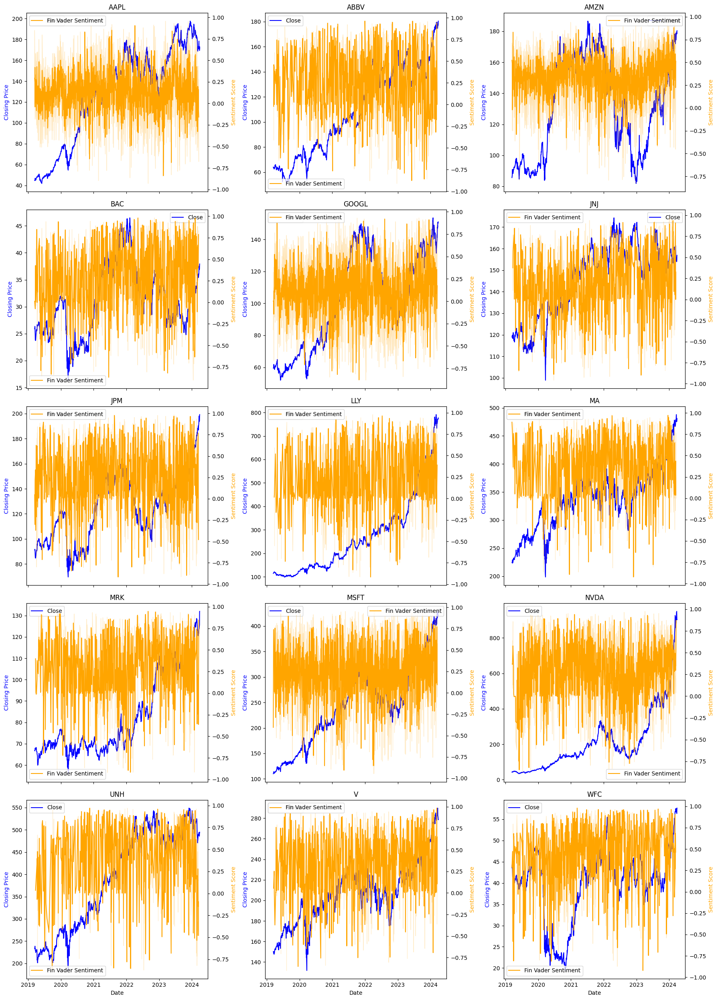

In [52]:

# Assuming your DataFrame is named `df`
tickers = df['Ticker'].unique()

# Define the number of rows and columns for subplots
num_tickers = len(tickers)
num_cols = 3
num_rows = (num_tickers // num_cols) + (num_tickers % num_cols > 0)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, num_rows * 5), sharex=True)
axes = axes.flatten()

for i, ticker in enumerate(tickers):
    ax = axes[i]
    subset = df[df['Ticker'] == ticker]
    
    # Plot closing price
    sns.lineplot(data=subset, x='Date', y='Close', ax=ax, label='Close', color='blue')
    # Plot sentiment score on secondary y-axis
    ax2 = ax.twinx()
    sns.lineplot(data=subset, x='Date', y='finvader', ax=ax2, label='Fin Vader Sentiment', color='orange')
    
    ax.set_title(ticker)
    ax.set_xlabel('Date')
    ax.set_ylabel('Closing Price', color='blue')
    ax2.set_ylabel('Sentiment Score', color='orange')

# Remove any empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


### Time series plot of Closing Volume and Vader Sentiment Score

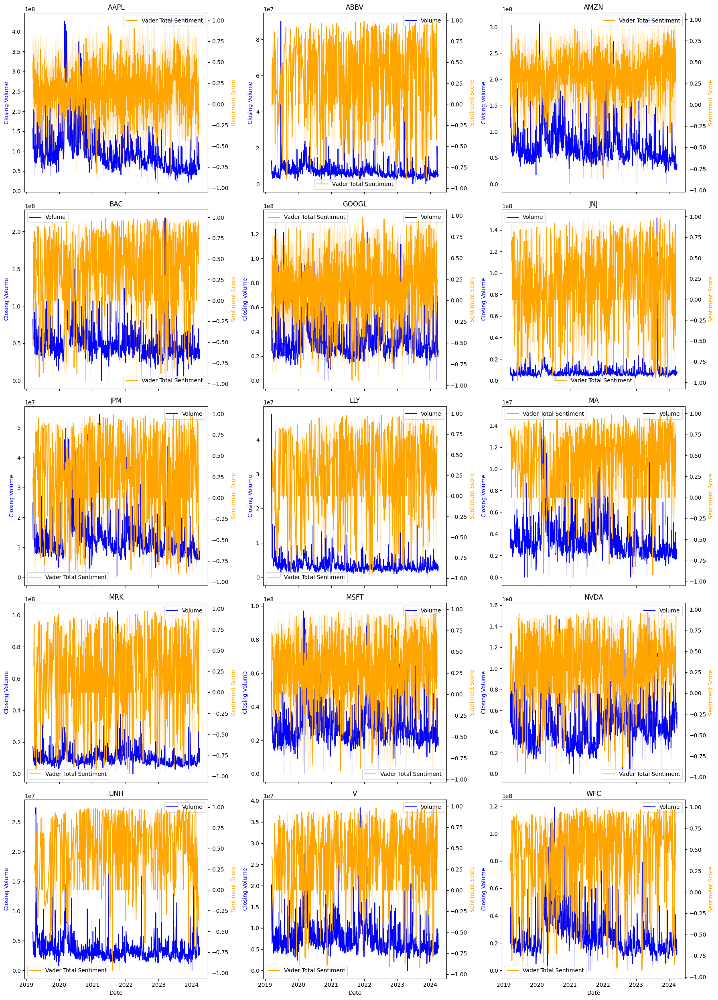

In [53]:

# Assuming your DataFrame is named `df`
tickers = df['Ticker'].unique()

# Define the number of rows and columns for subplots
num_tickers = len(tickers)
num_cols = 3
num_rows = (num_tickers // num_cols) + (num_tickers % num_cols > 0)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, num_rows * 5), sharex=True)
axes = axes.flatten()

for i, ticker in enumerate(tickers):
    ax = axes[i]
    subset = df[df['Ticker'] == ticker]
    
    # Plot closing price
    sns.lineplot(data=subset, x='Date', y='Volume', ax=ax, label='Volume', color='blue')
    # Plot sentiment score on secondary y-axis
    ax2 = ax.twinx()
    sns.lineplot(data=subset, x='Date', y='sentiment_tot', ax=ax2, label='Vader Total Sentiment', color='orange')
    
    ax.set_title(ticker)
    ax.set_xlabel('Date')
    ax.set_ylabel('Closing Volume', color='blue')
    ax2.set_ylabel('Sentiment Score', color='orange')

# Remove any empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


### Time series plot of Closing Volume and Fin Vader Sentiment Score

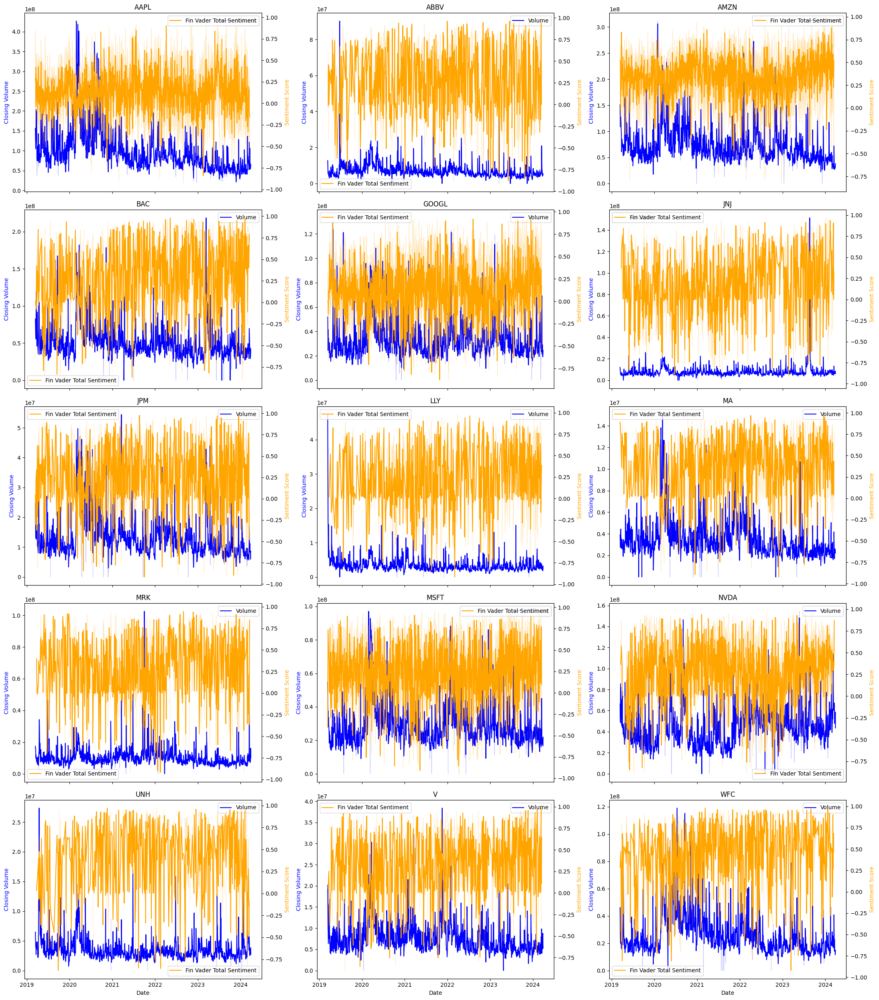

In [54]:

# Assuming your DataFrame is named `df`
tickers = df['Ticker'].unique()

# Define the number of rows and columns for subplots
num_tickers = len(tickers)
num_cols = 3
num_rows = (num_tickers // num_cols) + (num_tickers % num_cols > 0)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(22, num_rows * 5), sharex=True)
axes = axes.flatten()

for i, ticker in enumerate(tickers):
    ax = axes[i]
    subset = df[df['Ticker'] == ticker]
    
    # Plot closing price
    sns.lineplot(data=subset, x='Date', y='Volume', ax=ax, label='Volume', color='blue')
    # Plot sentiment score on secondary y-axis
    ax2 = ax.twinx()
    sns.lineplot(data=subset, x='Date', y='finvader', ax=ax2, label='Fin Vader Total Sentiment', color='orange')
    
    ax.set_title(ticker)
    ax.set_xlabel('Date')
    ax.set_ylabel('Closing Volume', color='blue')
    ax2.set_ylabel('Sentiment Score', color='orange')

# Remove any empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


### Sector Comaprison

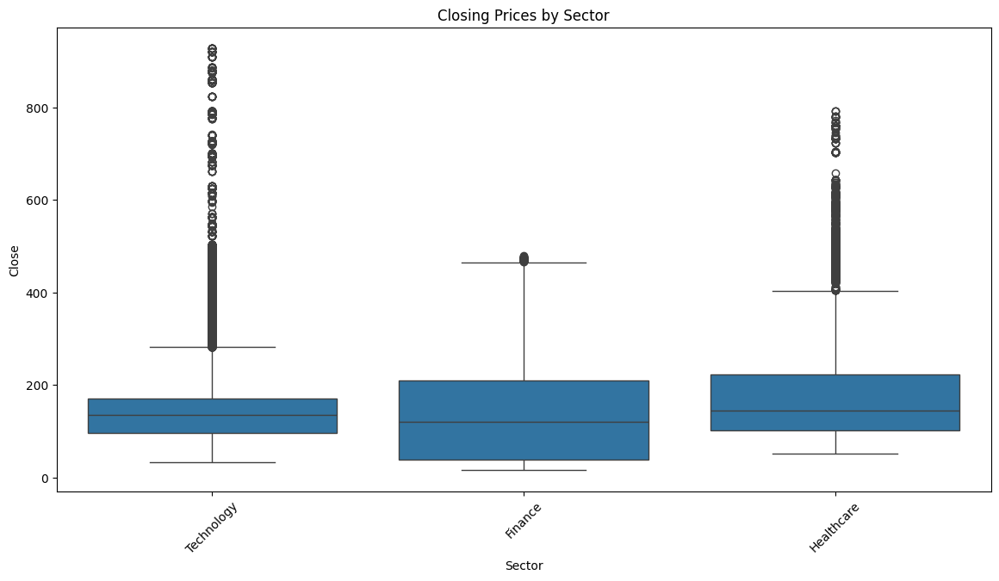

In [55]:
# Box plot for closing prices by sector
plt.figure(figsize=(14, 7))
sns.boxplot(x='Sector', y='Close', data=df)
plt.title('Closing Prices by Sector')
plt.xticks(rotation=45)
plt.show()

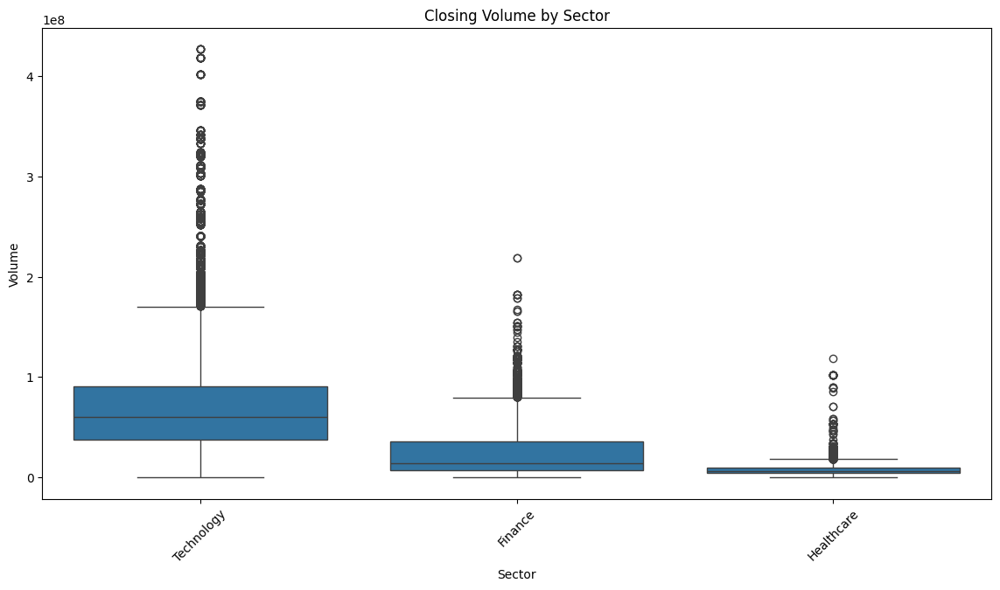

In [56]:
# Box plot for closing prices by sector
plt.figure(figsize=(14, 7))
sns.boxplot(x='Sector', y='Volume', data=df)
plt.title('Closing Volume by Sector')
plt.xticks(rotation=45)
plt.show()

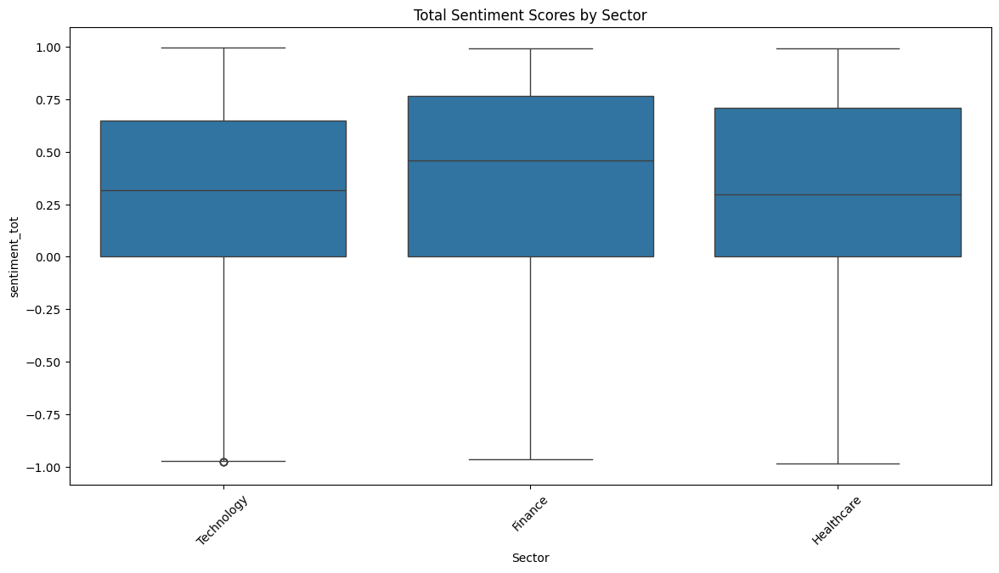

In [57]:
# Box plot for sentiment scores by sector
plt.figure(figsize=(14, 7))
sns.boxplot(x='Sector', y='sentiment_tot', data=df)
plt.title('Total Sentiment Scores by Sector')
plt.xticks(rotation=45)
plt.show()

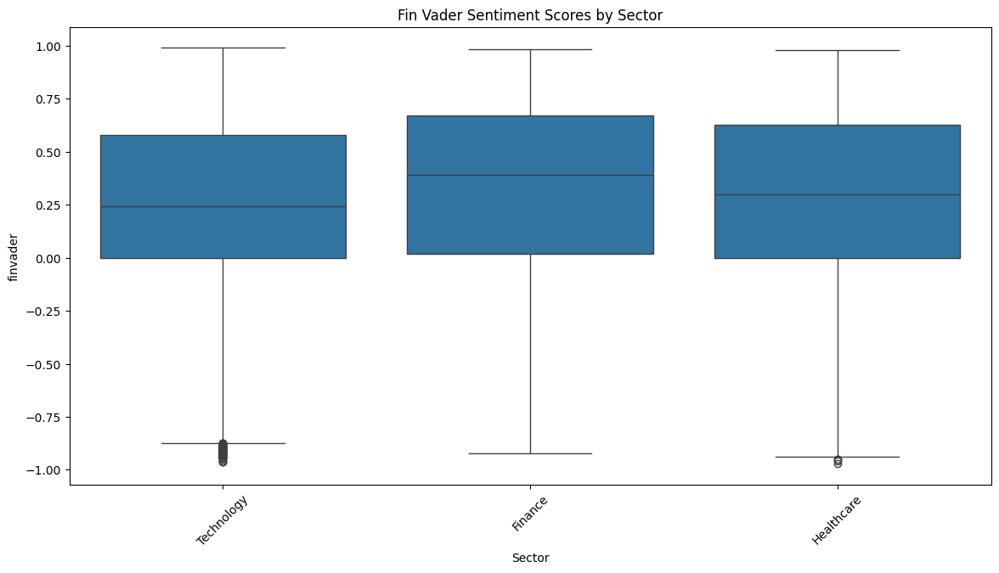

In [58]:
# Box plot for sentiment scores by sector
plt.figure(figsize=(14, 7))
sns.boxplot(x='Sector', y='finvader', data=df)
plt.title('Fin Vader Sentiment Scores by Sector')
plt.xticks(rotation=45)
plt.show()

### Volatility Analysis

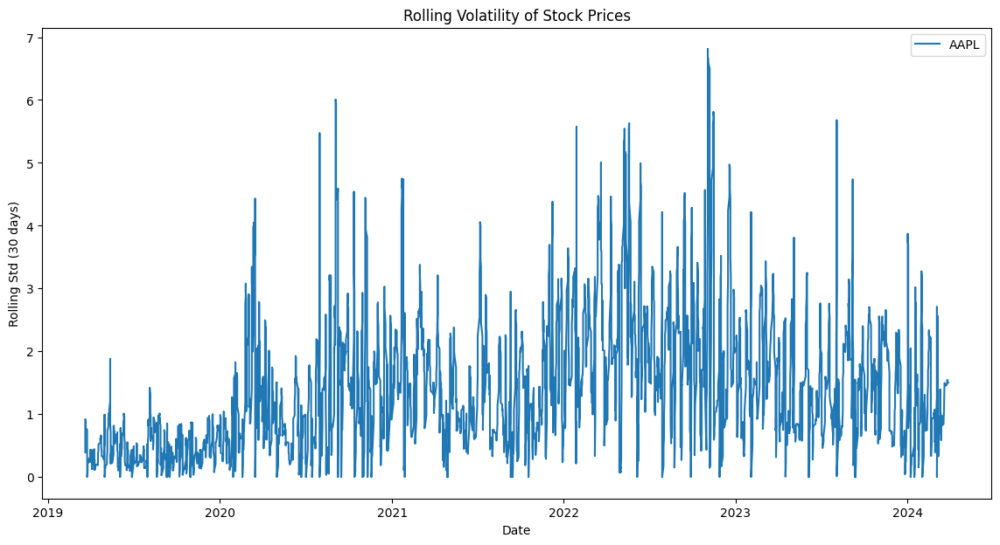

In [59]:
# Calculate rolling volatility
df['rolling_std'] = df.groupby('Ticker')['Close'].transform(lambda x: x.rolling(window=30).std())

# Plot rolling volatility
plt.figure(figsize=(14, 7))
for ticker in df['Ticker'].unique()[:1]:
    subset = df[df['Ticker'] == ticker]
    plt.plot(subset['Date'], subset['rolling_std'], label=ticker)
plt.title('Rolling Volatility of Stock Prices')
plt.xlabel('Date')
plt.ylabel('Rolling Std (30 days)')
plt.legend()
plt.show()

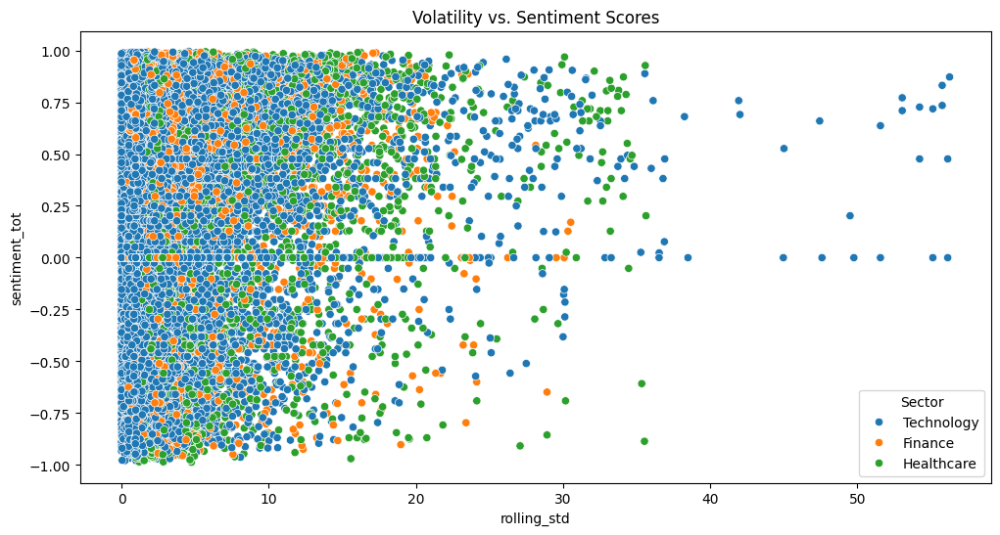

In [60]:
# Scatter plot to see relationship between volatility and sentiment
plt.figure(figsize=(12, 6))
sns.scatterplot(x='rolling_std', y='sentiment_tot', hue='Sector', data=df)
plt.title('Volatility vs. Sentiment Scores')
plt.show()

### Anomaly Detection

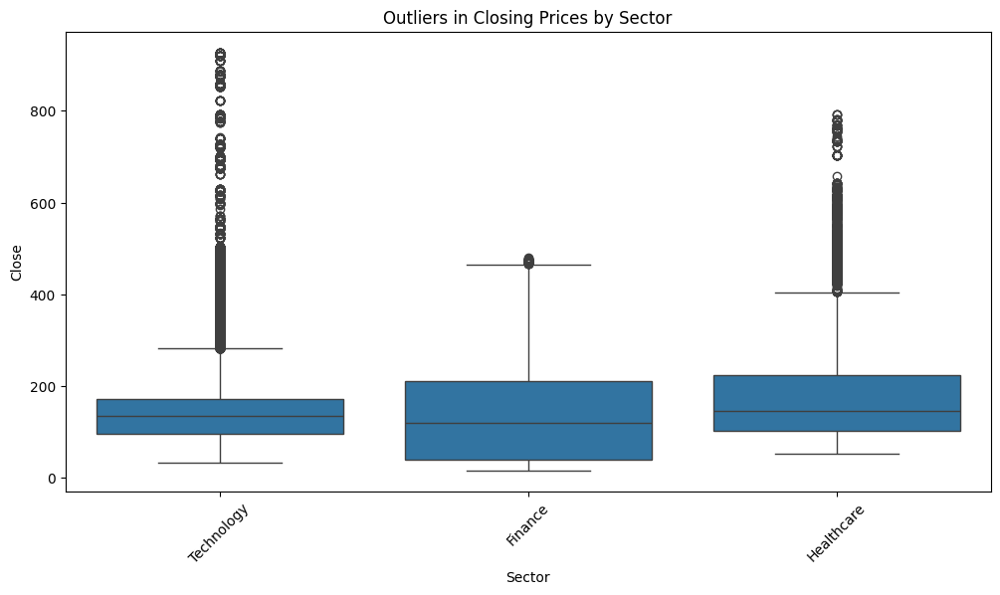

In [61]:
# Identify outliers in closing prices
plt.figure(figsize=(12, 6))
sns.boxplot(x='Sector', y='Close', data=df)
plt.title('Outliers in Closing Prices by Sector')
plt.xticks(rotation=45)
plt.show()



In [62]:
# Event analysis (e.g., significant price drops or spikes)
significant_events = df[(df['Close'] > df['Close'].quantile(0.95)) | (df['Close'] < df['Close'].quantile(0.05))]
print(significant_events[['Date', 'Ticker', 'Close', 'Volume', 'sentiment_tot', 'Headline']])


            Date Ticker       Close      Volume  sentiment_tot  \
10    2019-03-15    BAC   25.892477  82346200.0        -0.5367   
36    2019-03-18    BAC   26.352005  58568600.0            NaN   
67    2019-03-19    BAC   26.201773  55455100.0            NaN   
101   2019-03-20    BAC   25.309237  81689900.0            NaN   
141   2019-03-21    BAC   24.902729  77444400.0            NaN   
...          ...    ...         ...         ...            ...   
69379 2024-03-28    LLY  776.636230   3209400.0            NaN   
69380 2024-03-28     MA  480.903900   2214500.0            NaN   
69382 2024-03-28   MSFT  419.962494  21871200.0            NaN   
69383 2024-03-28   NVDA  903.559998  43521200.0            NaN   
69384 2024-03-28    UNH  494.700012   3820000.0            NaN   

                                                Headline  
10     Jim Cramer Gives His Opinion On Bank Of Americ...  
36                                                   NaN  
67                            

### Feature importance

In [63]:
from sklearn.model_selection import train_test_split

In [64]:
start_date = '2019-03-15'
end_date = '2023-03-01'
df_train= df[(df['Date'] >= start_date) & (df['Date'] <= end_date)]

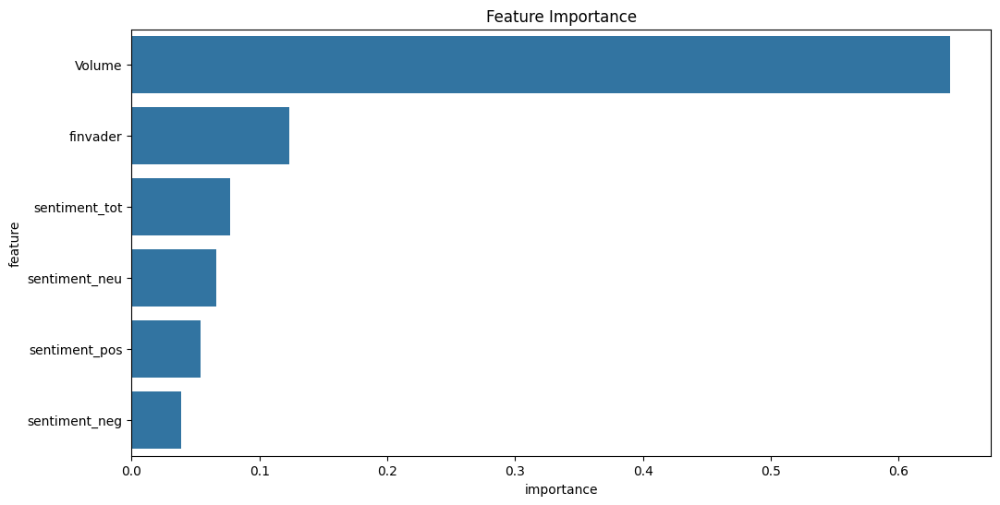

In [65]:
# Preliminary feature importance analysis using a simple model
from sklearn.ensemble import RandomForestRegressor

# Prepare data
features = ['sentiment_neg', 'sentiment_neu', 'sentiment_pos', 'sentiment_tot', 'finvader', 'Volume']
X = df_train[features]
y = df_train['Close']

# Train a simple model
model = RandomForestRegressor()
model.fit(X, y)

# Feature importance
importances = model.feature_importances_
feature_importance_df = pd.DataFrame({'feature': features, 'importance': importances})
feature_importance_df = feature_importance_df.sort_values(by='importance', ascending=False)

# Plot feature importance
plt.figure(figsize=(12, 6))
sns.barplot(x='importance', y='feature', data=feature_importance_df)
plt.title('Feature Importance')
plt.show()
